# Demonstration of CLiMAF operator 'plotmap', 

## See doc at https://climaf.readthedocs.io/en/master/scripts/plotmap.html
### plotmap is a replacement for Ncl-based operator 'plot'; it is backed by script plotmap.py which uses matplotlib, cartopy and geocat


In [1]:
from climaf.api import *

python => 3.10.13 | packaged by conda-forge | (main, Oct 26 2023, 18:07:37) [GCC 12.3.0]
---
Required softwares to run CliMAF => you are using the following versions/installations:


CliMAF climaf_version = 3.0
CliMAF install => /home/ssenesi/climaf_installs/climaf_running
Cache directory set to : /data/ssenesi/climaf_cache (use $CLIMAF_CACHE if set) 
Cache directory for remote data set to : /data/ssenesi/climaf_cache/remote_data (use $CLIMAF_REMOTE_CACHE if set) 
Available macros read from ~/.climaf.macros are : []
error    : second argument ('curl_tau_atm') must be a script or operator, already declared


In [2]:
# Some CMIP data
data = fds(
    cpath + "/../examples/data/tas_Amon_CNRM-CM5_historical_r1i1p1_185001-185212.nc")

In [3]:
# More example data
dg = ds(project="example", simulation="AMIPV6ALB2G",
        variable="tas", period="1981", frequency="monthly")

In [4]:
# When developing the script of a CliMAF operator, we may wish to systematically
# recompute the object we look at
# Redefining function cshow allows for that
def cshow(obj):
    climaf.api.cshow(obj, drop=True)

## Basics

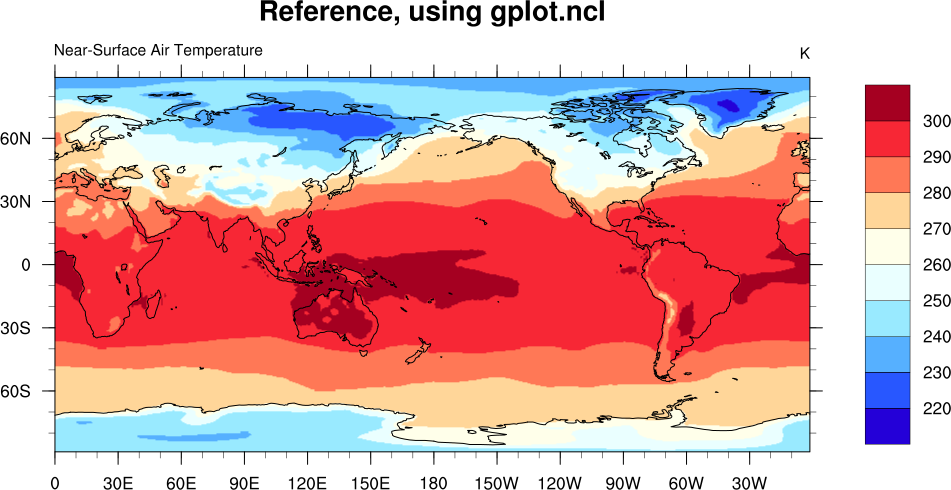

In [6]:
# For reference, a figure using the old script (gplot.ncl)
cshow(plot(data, title="Reference, using gplot.ncl"))

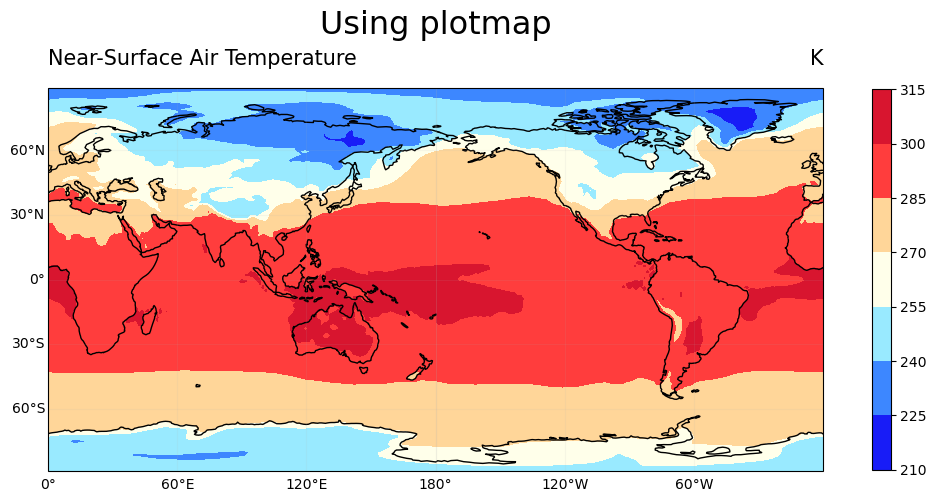

In [7]:
# Same with new script. Mapping values to colors is slightly different 
cshow(plotmap(data, title="Using plotmap"))

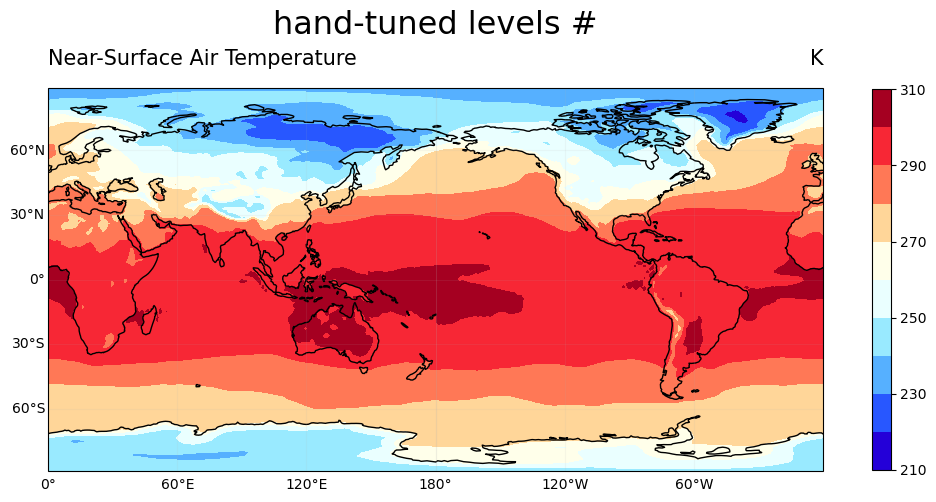

In [8]:
# One can easily tune the number of levels used
cshow(plotmap(data, title="hand-tuned levels #", levels=10))

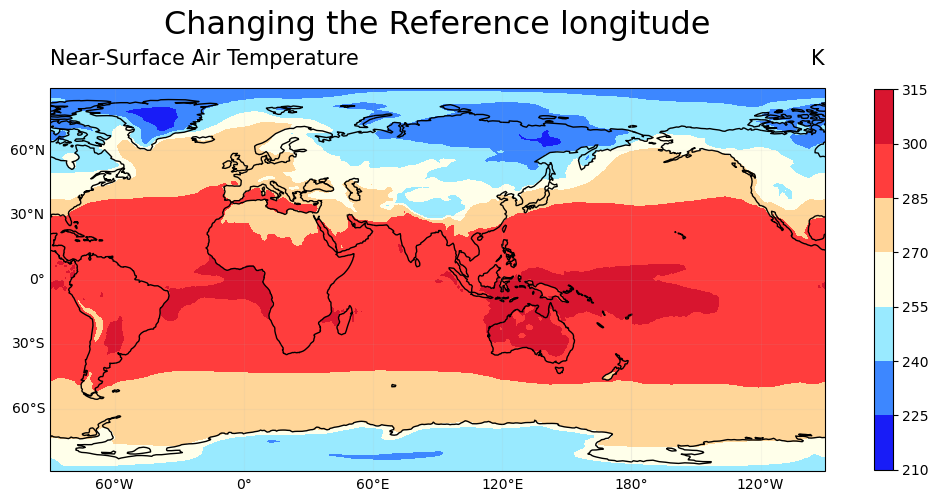

In [10]:
# Changing the Reference longitude
cshow(plotmap(data, title="Changing the Reference longitude", 
              proj="PlateCarree", proj_options={"central_longitude":90}))

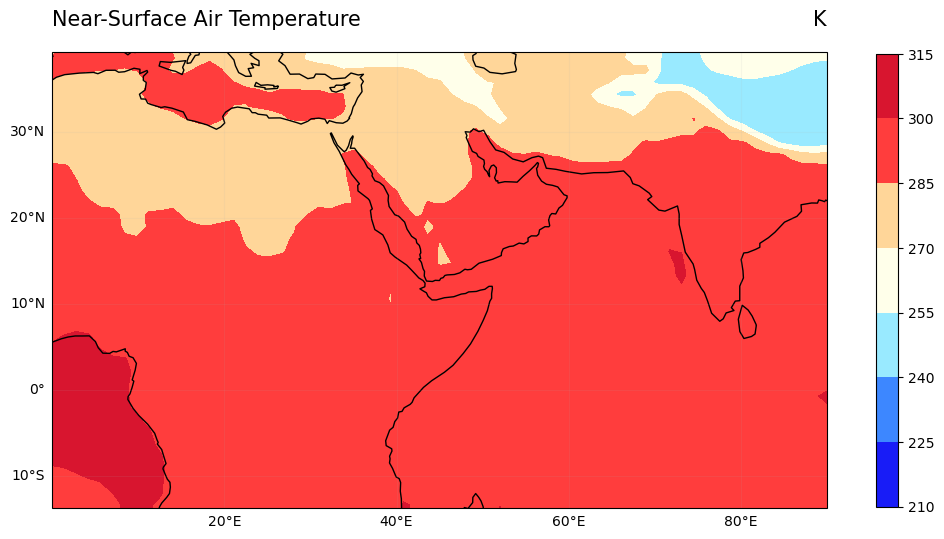

In [13]:
# The part of the coordinates range shown is called the 'extent'
# You can change it, but you must specify longitudes that fits in central_longitude +/- 180°
# So, by default (i.e. central_longitude=180), that fits in  [ 0, 360 [
cshow(plotmap(data,axis_methods={'set_extent': {'extents': (0 , 90, -10, 30) }}))

## Title and other strings are managed by function [geocat.viz.util.set_titles_and_labels](https://geocat-viz.readthedocs.io/en/latest/user_api/generated/geocat.viz.util.set_titles_and_labels.html) wich uses arguments in 'title_options'

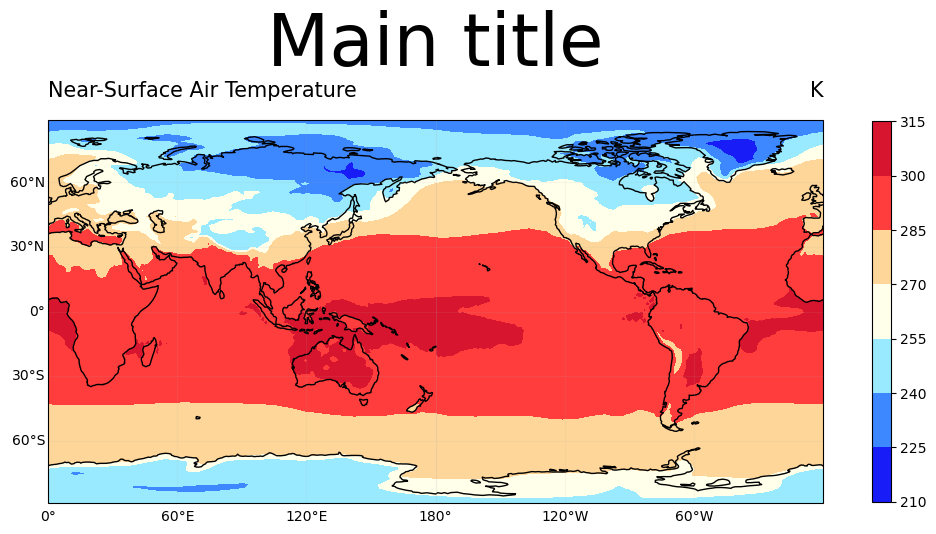

In [14]:
# Playing with title size
cshow(plotmap(data, title='Main title',
              title_options = {'maintitlefontsize':50}))

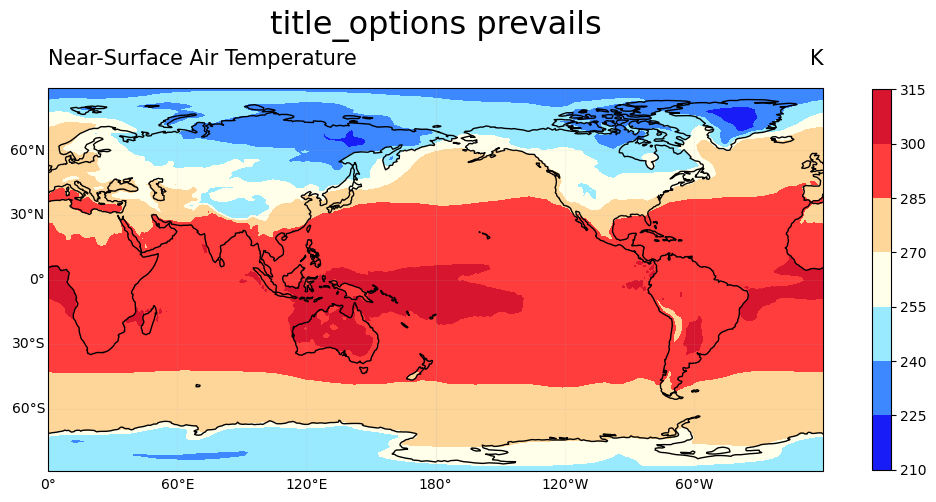

In [15]:
# If you provide both 'main_title' in 'title_options' and 'title', the former prevails
cshow(plotmap(data, title='Main title',
              title_options = {'maintitle':'title_options prevails'}))

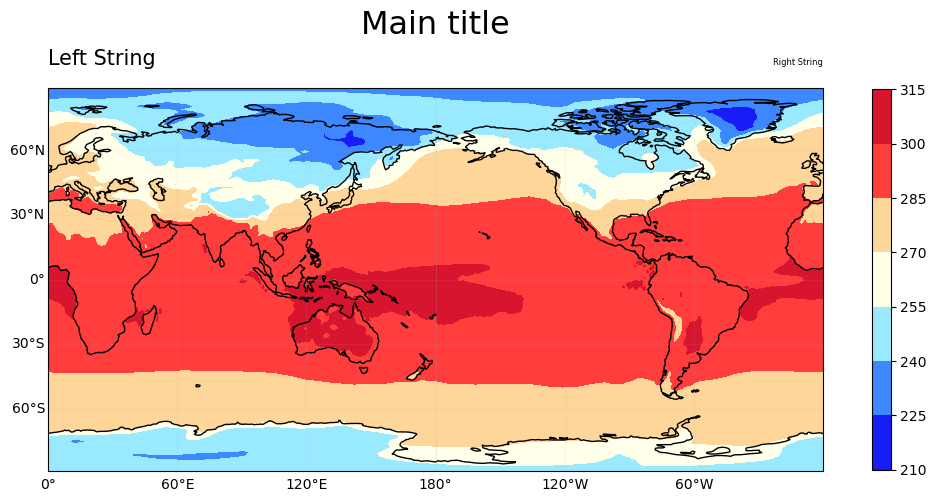

In [16]:
# Controling upper left and right strings
cshow(plotmap(data, title='Main title',
              title_options = {
                  'lefttitle':'Left String',
                  'righttitle':'Right String',
                  'righttitlefontsize': 6,
              }))

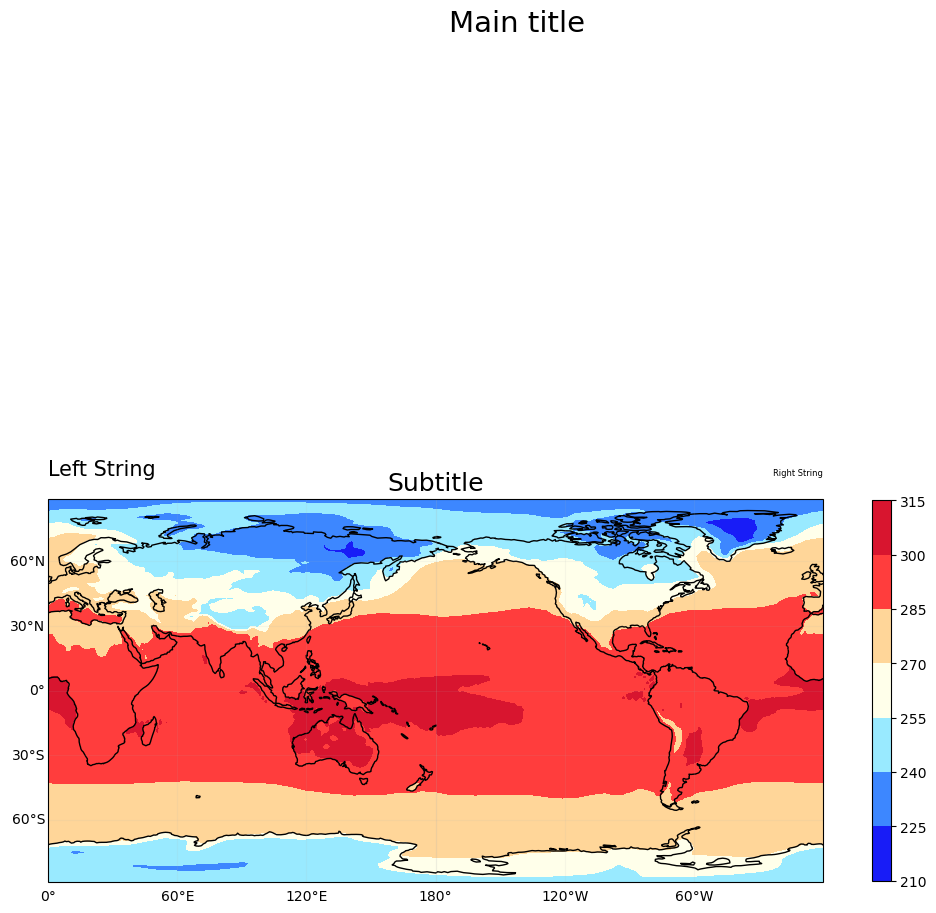

In [18]:
# Alas, using a subtitle ruins the vertical spacing (this is a bug in a geocat-viz function)
cshow(plotmap(data, title='Main title',
              title_options = {
                  'lefttitle':'Left String',
                  'righttitle':'Right String',
                  'righttitlefontsize': 6,
                  'subtitle':'Subtitle',}))

## Playing with colors

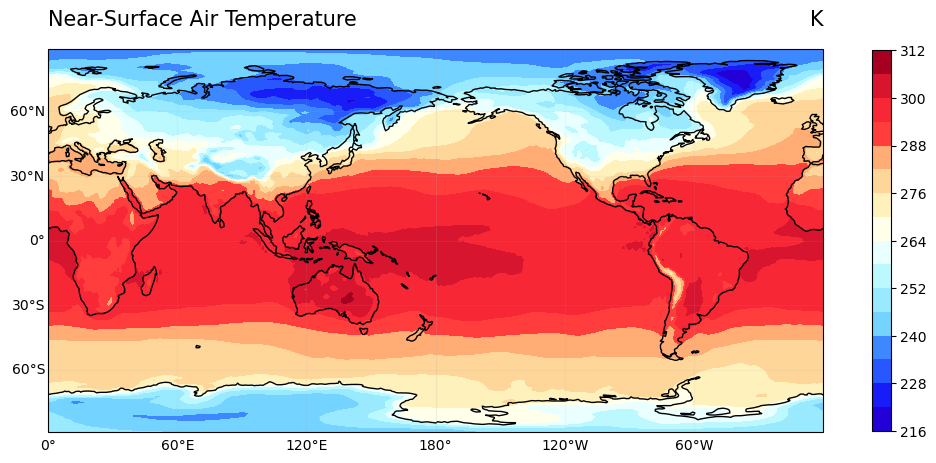

In [20]:
# Play with number of colors
cshow(plotmap(data, levels=15))

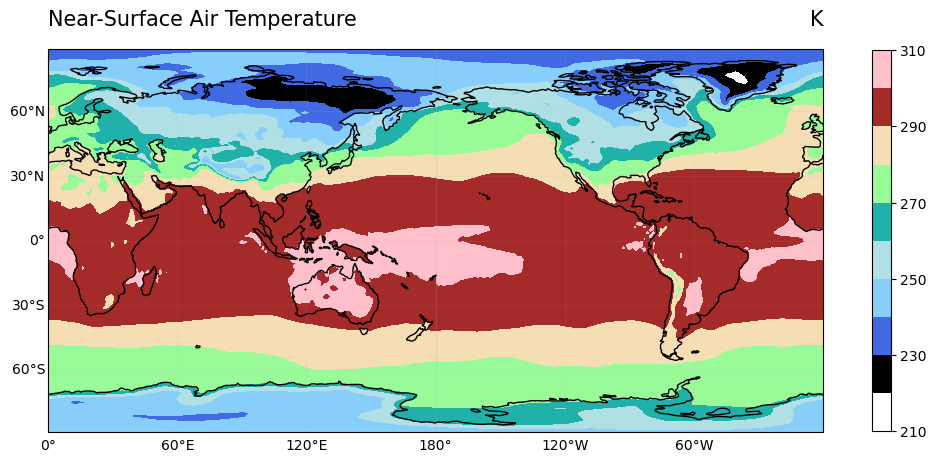

In [21]:
# Choosing each color
mycolors = 'white,black,RoyalBlue,LightSkyBlue,PowderBlue,lightseagreen,PaleGreen,Wheat,Brown,Pink'
cshow(plotmap(data, color= mycolors))

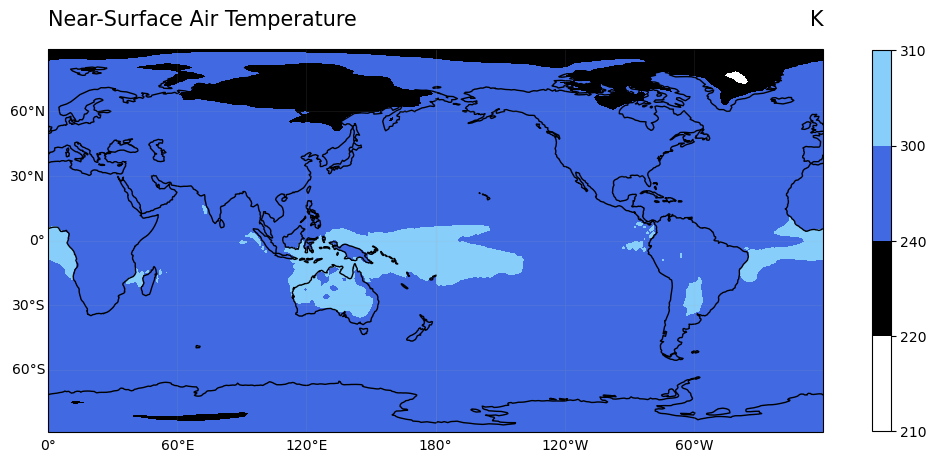

In [22]:
# Choosing the mapping of values to colors
mycolors = 'white,black,RoyalBlue,LightSkyBlue,PowderBlue'
mylevels = '210,220,240,300,310'
cshow(plotmap(data, color= mycolors, levels=mylevels))

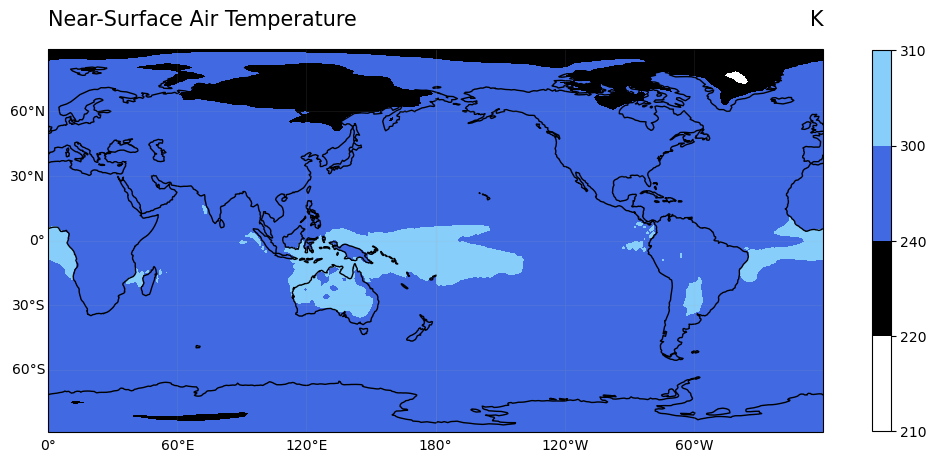

In [23]:
# 'colors' and levels" can also be python lists
mycolors = [ 'white' , 'black' , 'RoyalBlue' , 'LightSkyBlue' , 'PowderBlue' ]
mylevels = [210,220,240,300,310]
cshow(plotmap(data, color= mycolors, levels=mylevels))

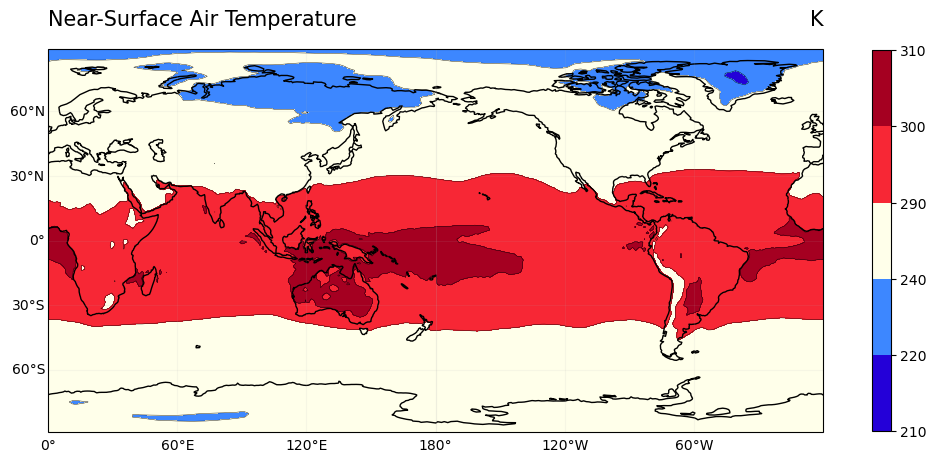

In [24]:
# Adding contours between colored regions
mylevels = [210,220,240,290,300,310]
cshow(plotmap(data, levels=mylevels, contours=1))

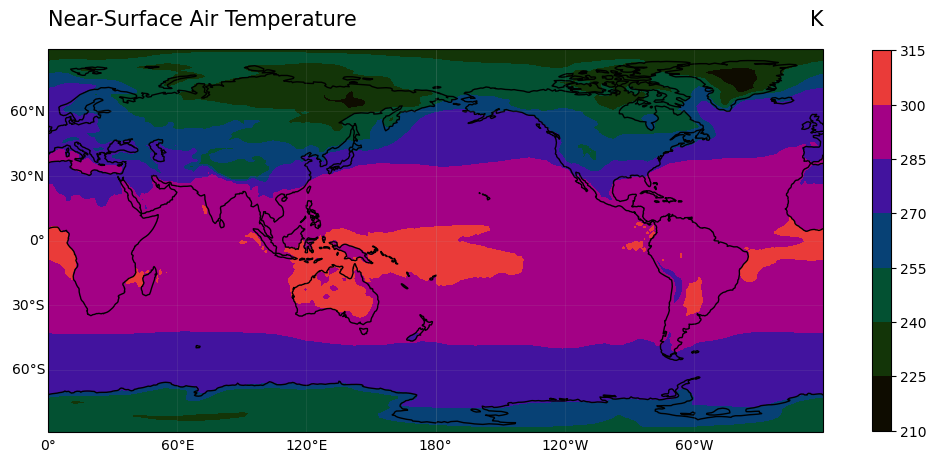

In [26]:
# NCL colormaps are available
cshow(plotmap(data, color = 'helix'))

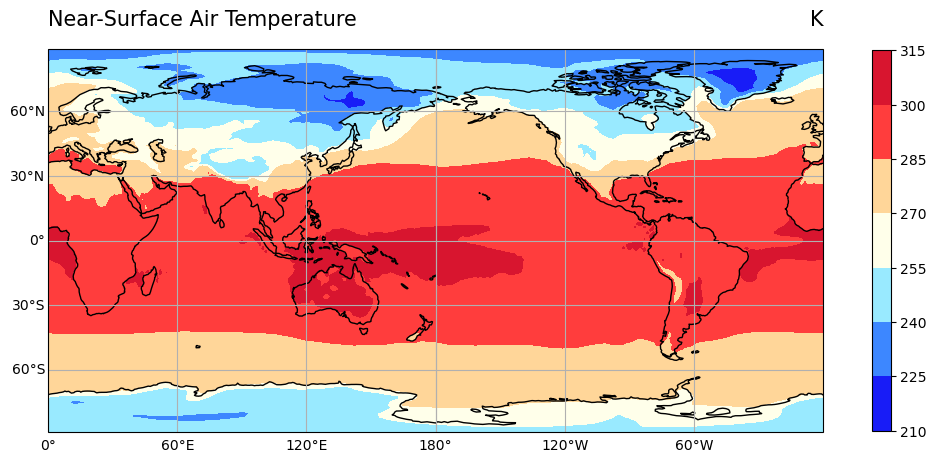

In [27]:
# How to change gridlines look
cshow(plotmap(data, axis_methods={
    'gridlines': { 
        'linewidths': 5, 
        'linestyles': 'dashed', 
        'draw_labels' : {"bottom": "x", "left": "y"}
    }}))

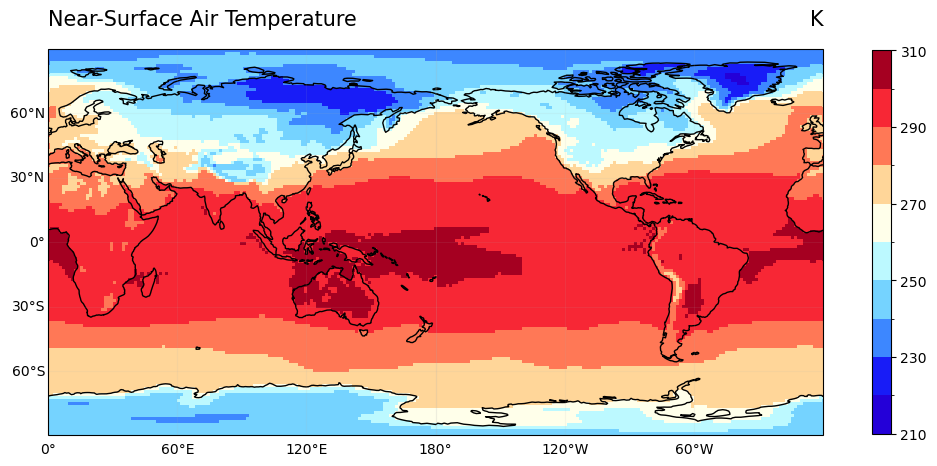

In [28]:
# To avoid smoothing, use colormap engine 'pcolormesh' 
cshow(plotmap(data, clre="pcolormesh"))

### Ploting contours

[210, 215, 220, 225, 230, 235, 240, 245, 250, 255, 260, 265, 270, 275, 280, 285, 290, 295, 300, 305]


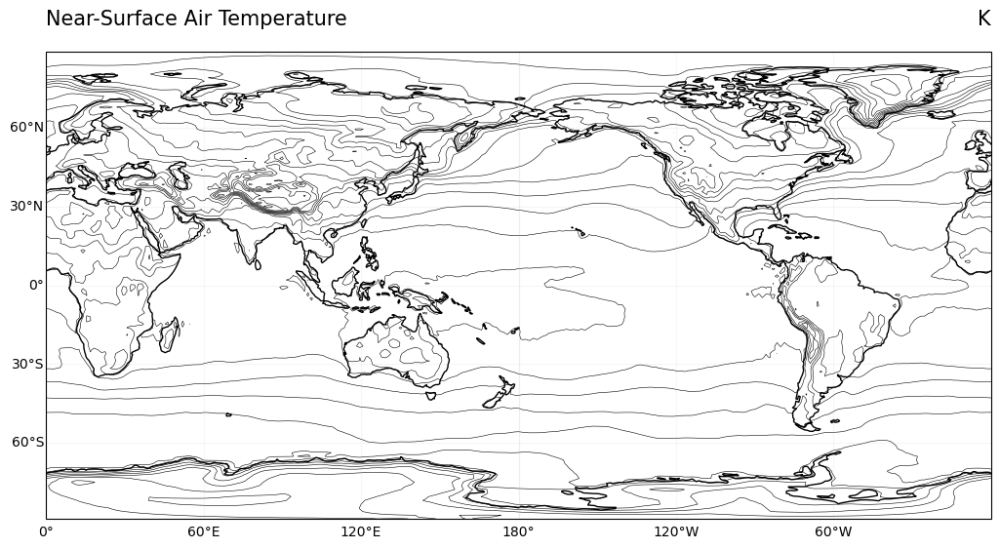

In [46]:
mycontours = list(range(210,310,5))
print(mycontours)
# Default plot does not show contour labels
cshow(plotmap("", data, contours=mycontours))

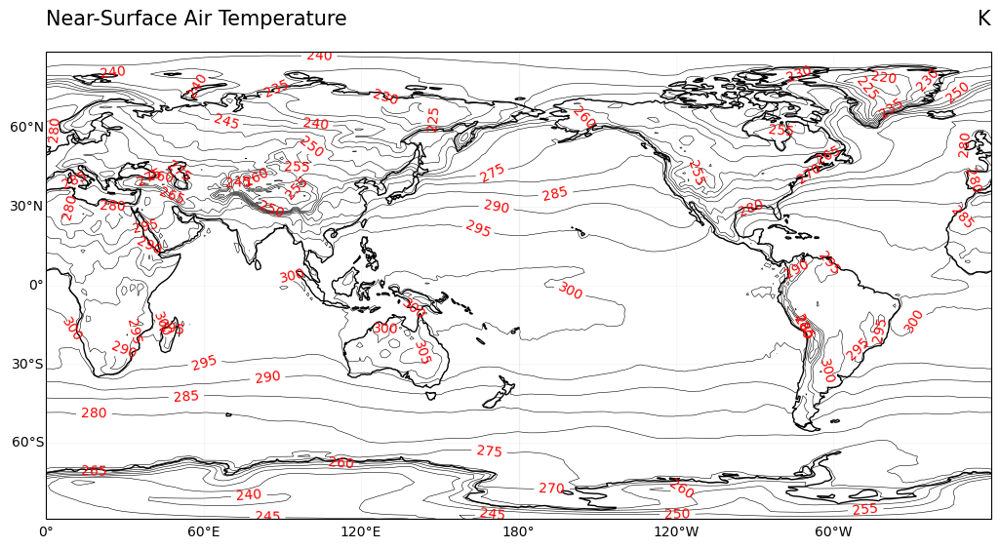

In [45]:
# Adding contour labels by invoking matplotlib.pyplot.clabel
cshow(plotmap("", data, contours=mycontours, plt_methods={'clabel':{'colors':'red'}}))

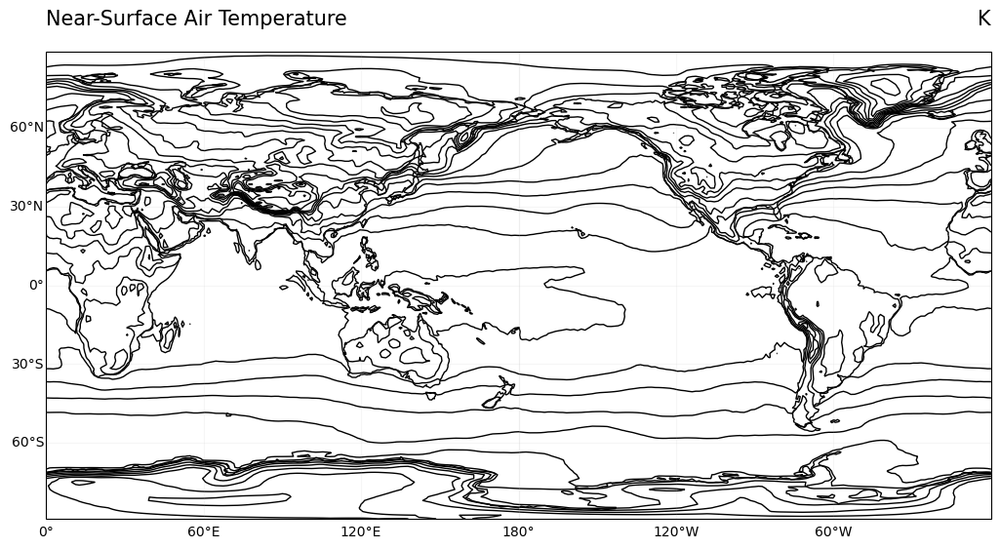

In [50]:
# Changing contours linewidths
cshow(plotmap("", data, contours=mycontours, contours_map_engine_options={'linewidths':1.}))

## Data selection

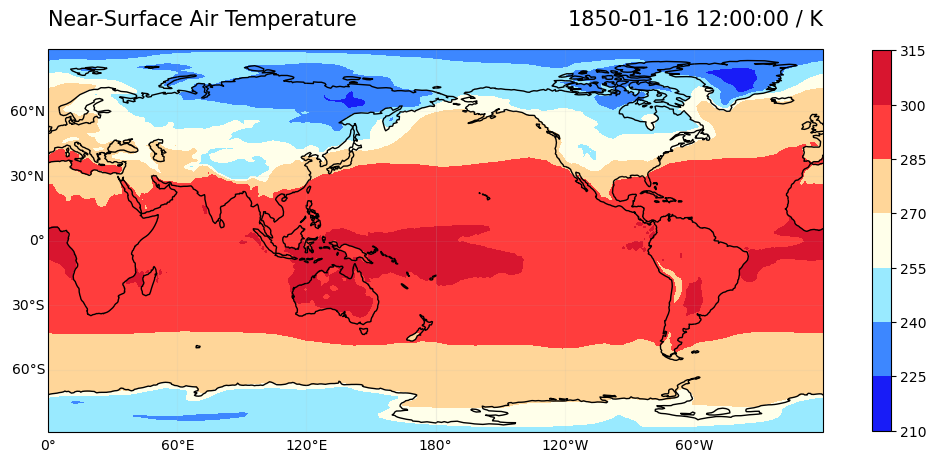

In [29]:
# Select on time index
cshow(plotmap(data, time=0, print_time=True))

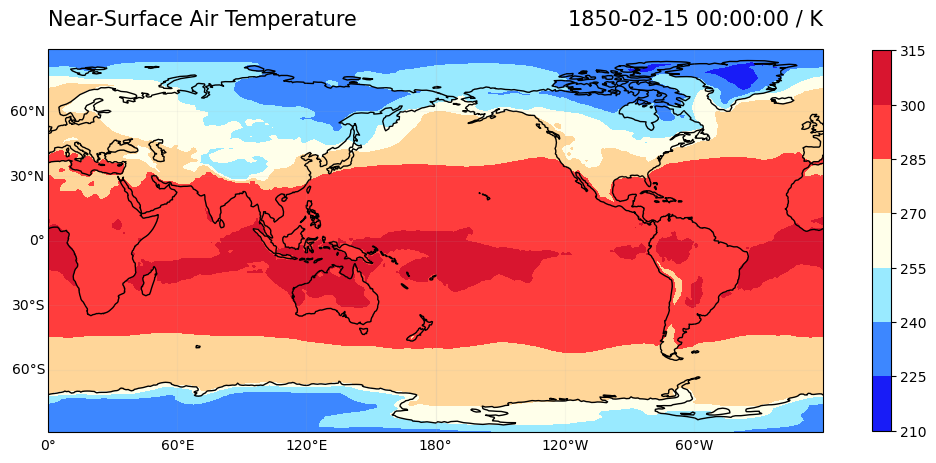

In [30]:
# Again selection on time index, with different index value
cshow(plotmap(data, time=1, print_time=True))

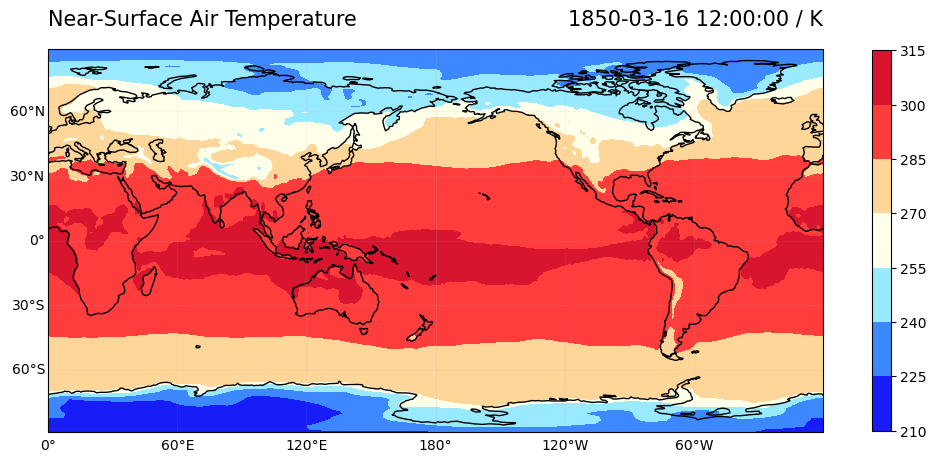

In [31]:
# Selection on date
cshow(plotmap(data, date='185003', print_time=True))

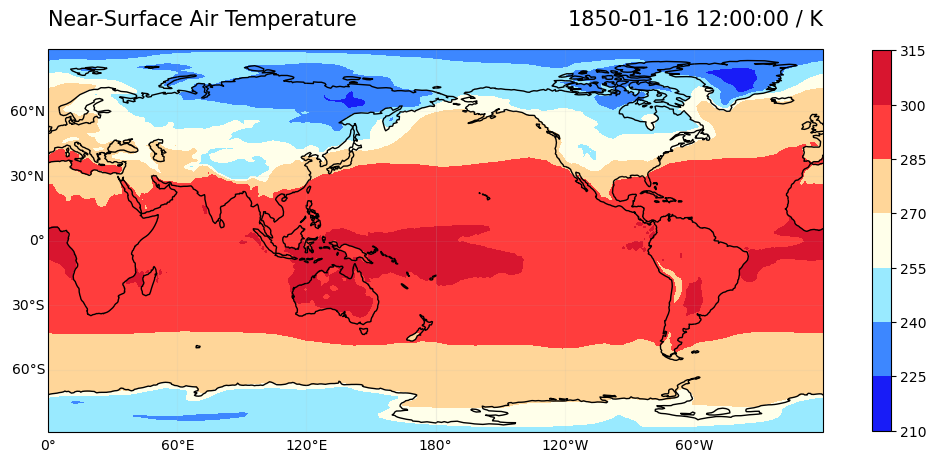

In [32]:
# Selection by providing explicit 'selection options' arguments
cshow(plotmap(data, clrso={"isel" : {"time": 0}}, print_time=True))

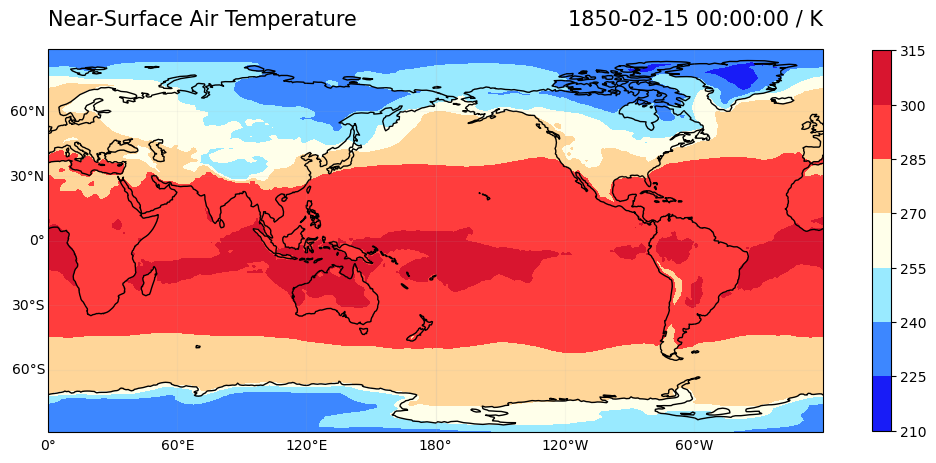

In [33]:
# Again: selection by providing explicit 'selection options' argument here with a date
cshow(plotmap(data, clrso={'sel' : {'time': '1850-02'}}, print_time=True))

## Mimicking various gplot options/args

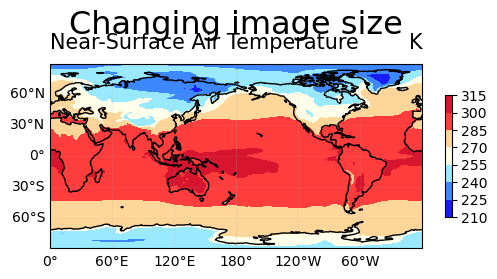

In [35]:
# Changing image size
cshow(plotmap(data, title="Changing image size", resolution="600x400"))

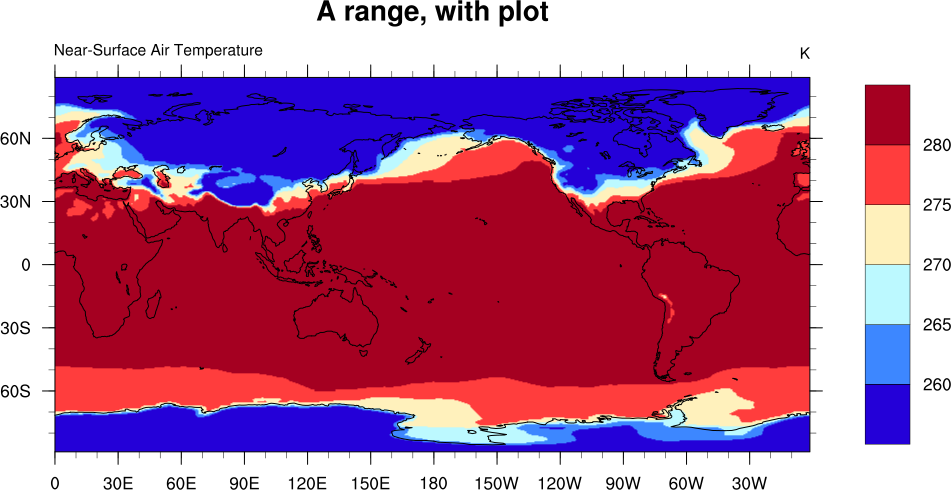

In [14]:
# Showing only a data range. Here is gplot.ncl reference
cshow(plot(data, min=260, max=280, delta=5, title="A range, with 'plot'"))

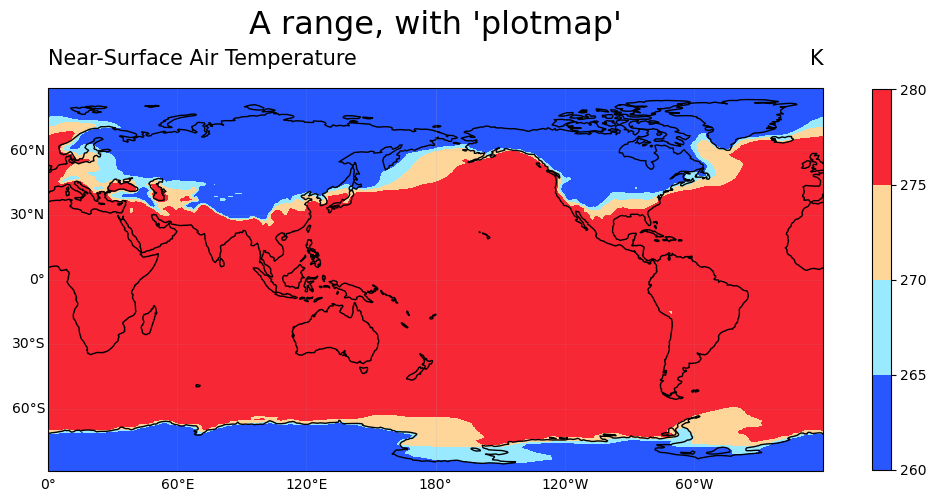

In [15]:
# Showing only a data range. Here is potmap version
cshow(plotmap(data, min = 260, max = 280, delta=5, title="A range, with 'plotmap'"))

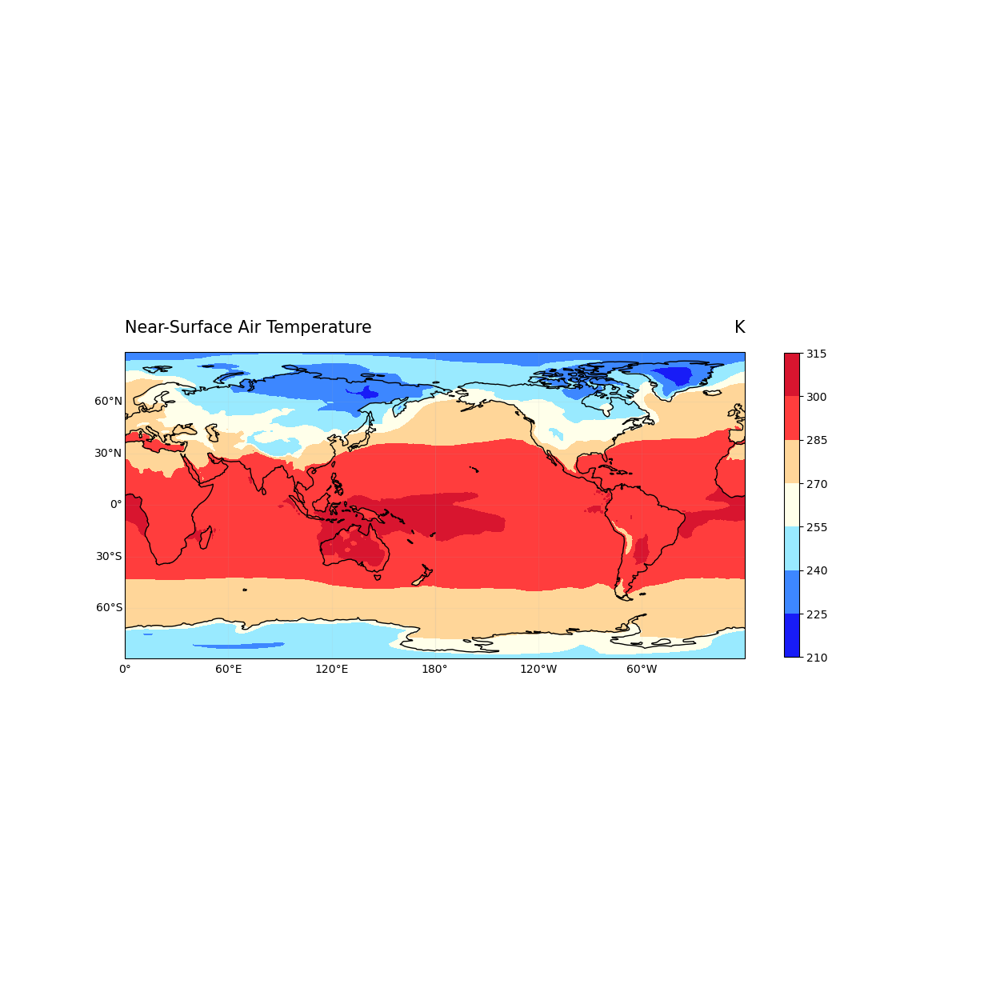

In [38]:
# What if surrounding white space is left
cshow(plotmap(data,trim=False))

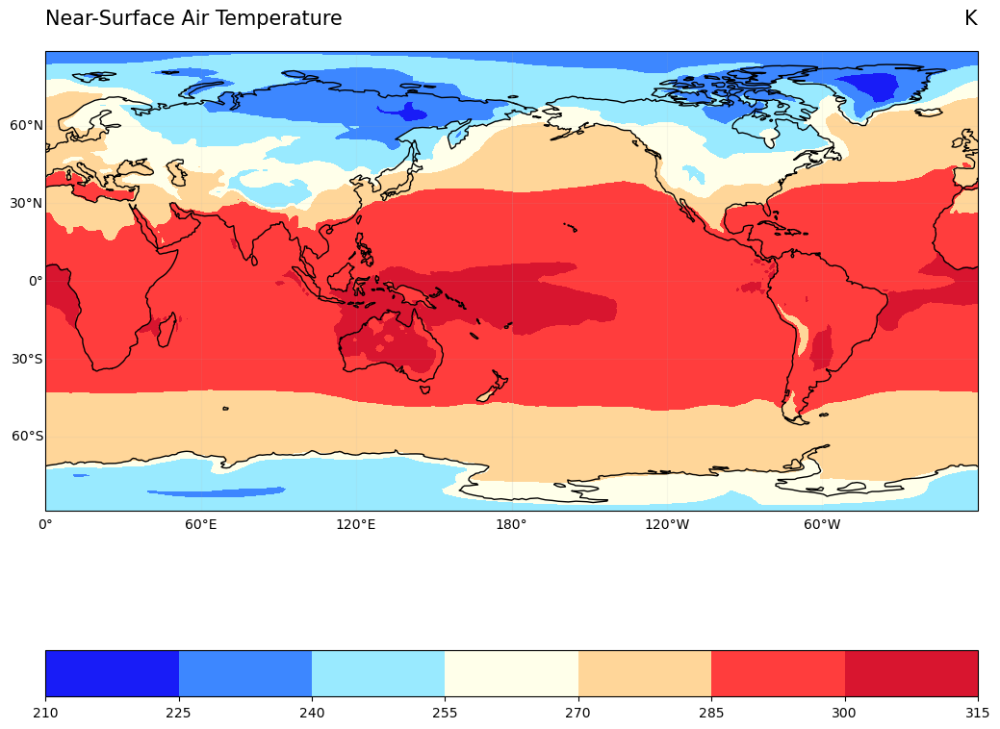

In [39]:
# Request an horizontal colorbar
cshow(plotmap(data,vcb=False))

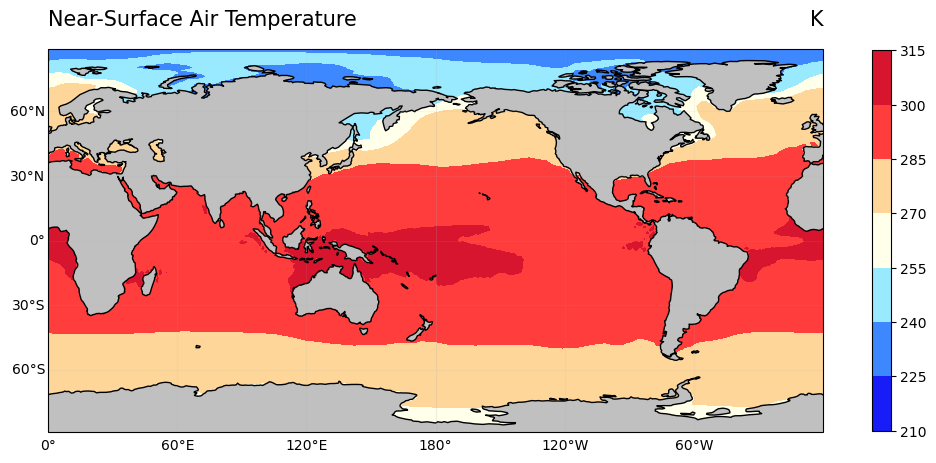

In [40]:
# Focus plot on ocean
cshow(plotmap(data,focus='ocean'))

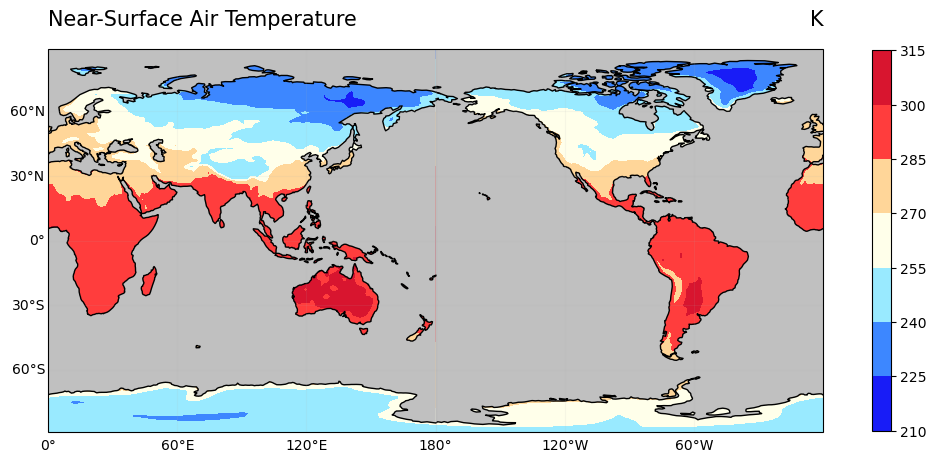

In [41]:
# Focus plot on land
cshow(plotmap(data,focus='land'))

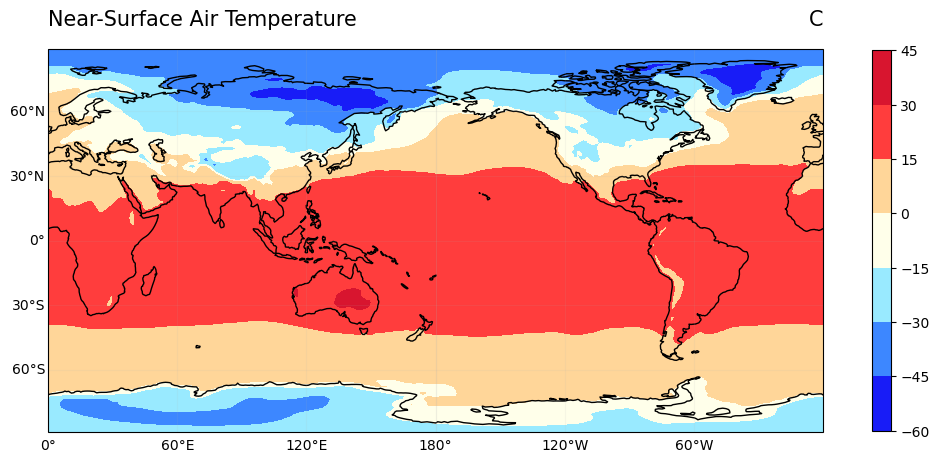

In [42]:
# Apply offset and change displayed units accordingly
cshow(plotmap(data, offset=-273.15, units="C"))

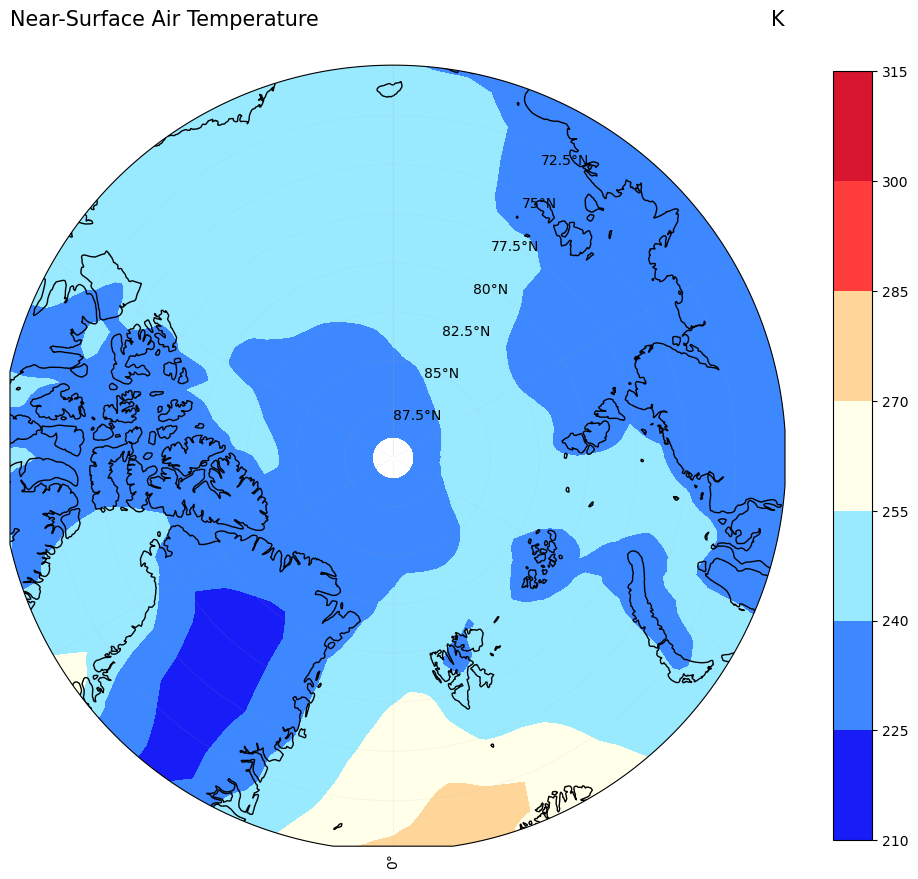

In [43]:
# Polar stereo projection 
cshow(plotmap(data,proj='NH70'))

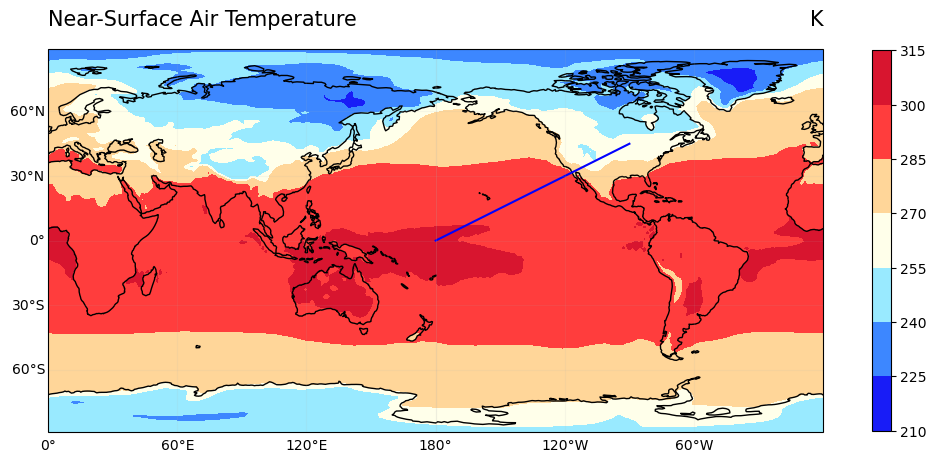

In [44]:
# Polylines
cshow(plotmap(data,xpolyline="0 90",ypolyline="0 45", polyline_options={'color': 'blue'}))

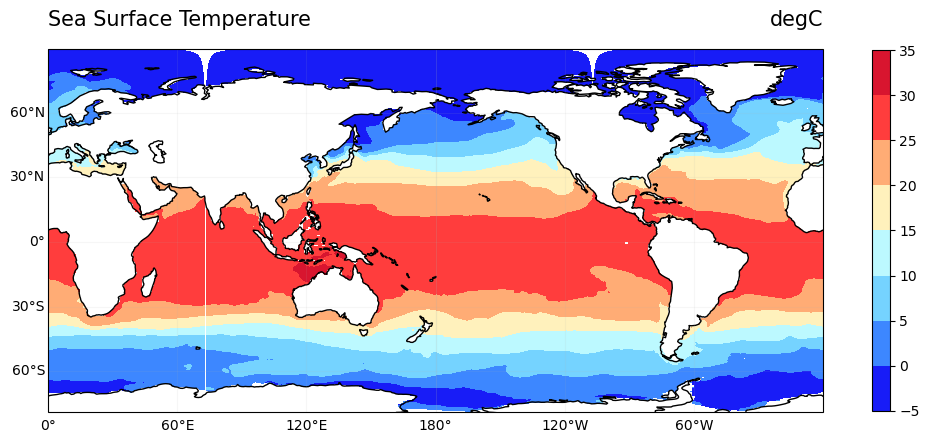

In [45]:
# Nemo data :
nd = fds(cpath + "/../examples/data/tos_Omon_CNRM_gn_185001-185003.nc")
cshow(plotmap(nd))

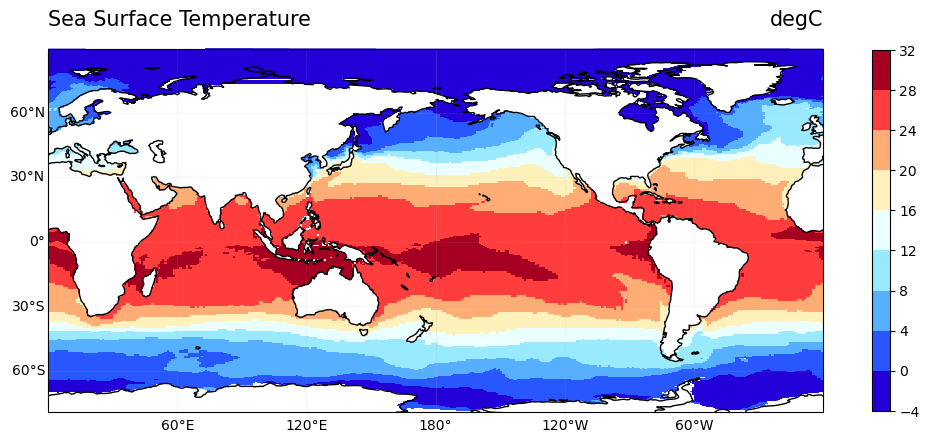

In [46]:
# Filling the gaps near ORCA grid poles needs another plot engine  :
cshow(plotmap(nd, clre="pcolormesh"))

## Pattern shading (hatching)
#### See also [hatch style reference](https://matplotlib.org/stable/gallery/shapes_and_collections/hatch_style_reference.html)

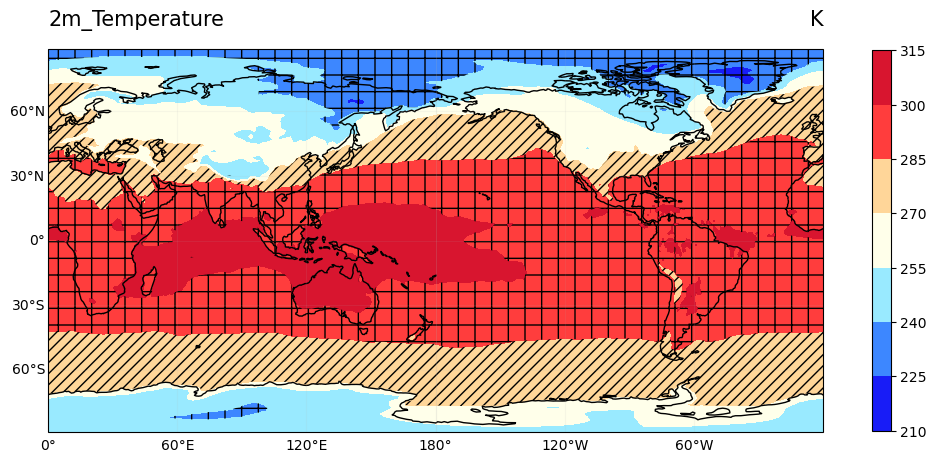

In [49]:
# Pattern-shading up to two fields, provided as 5th and/or 6th plotmap arg
# shdl (resp. shdl2) provides levels between which shading occurs
# shdh (resp shdh2) provides patterns list, which is reused circularly if needed
#    None means no pattern, repeated pattern character means increased density
cshow(plotmap(dg, "", "", "", dg, shdl=[210, 240, 270, 285, 300],shdh = ['+', None, '///']))

## Vectors

In [50]:
# Vector plots. Get data
ua = fds(cpath + "/../examples/data/uas_CNRM-CM6_sample.nc")
va = fds(cpath + "/../examples/data/vas_CNRM-CM6_sample.nc")

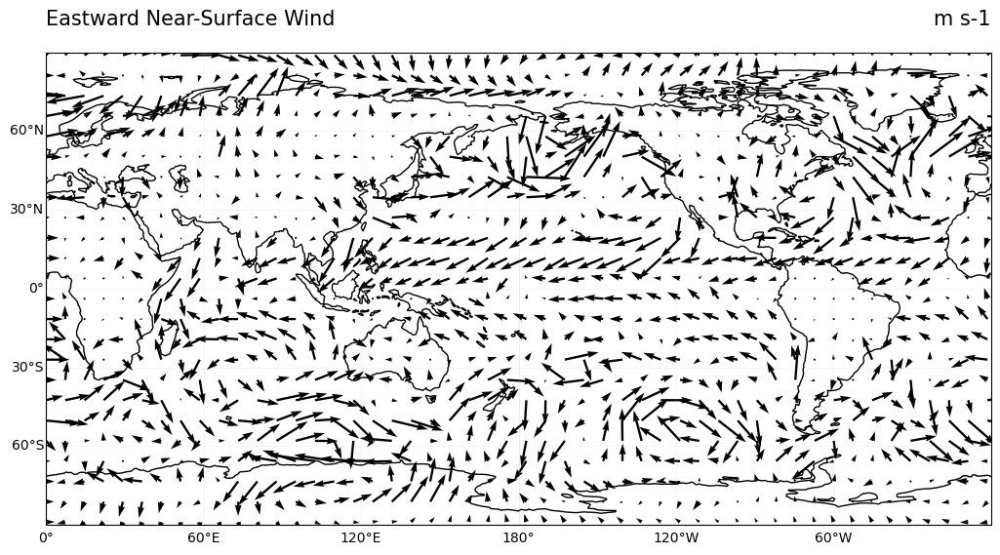

In [52]:
# Default vector representation type is 'quiver' (arrows)
# Vector components are args 3 and 4 of plotmap
cshow(plotmap("","",ua,va))

### Tuning vector grid size and arrows attributes. See [quiver doc](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.quiver.html#matplotlib.pyplot.quiver) for more options (but don't play with args X,Y, u, v)

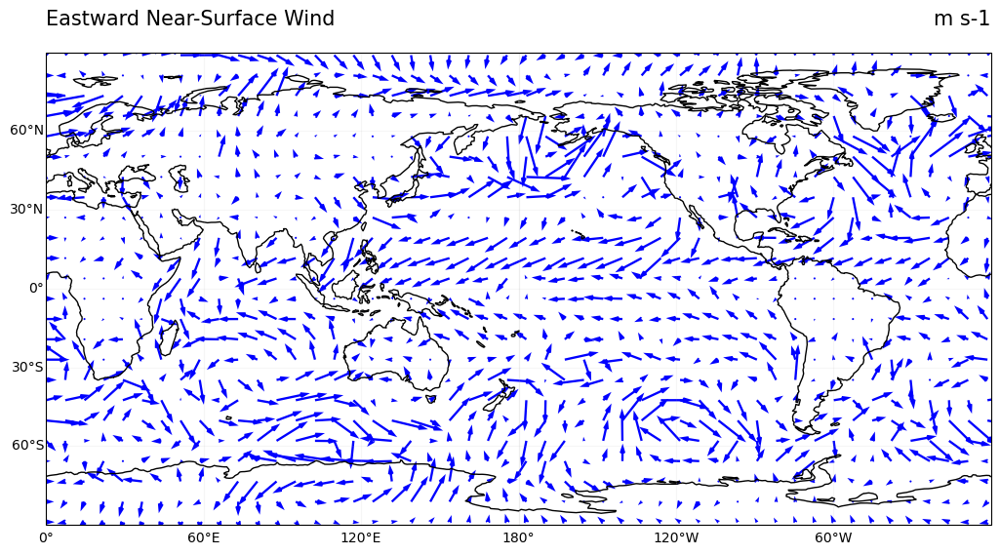

In [53]:
cshow(plotmap("","",ua,va,
              vecg=50, 
              veco={'color':'blue', 'headwidth':2.5, 'headlength':4}))

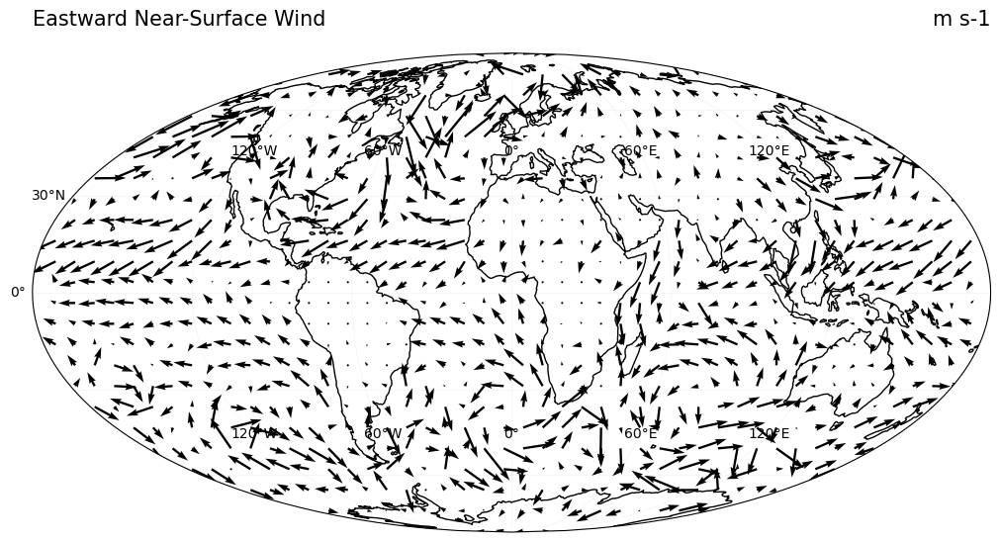

In [54]:
# Controling the map projection
cshow(plotmap("","",ua,va, proj="Mollweide"))

###  Another vector representation type is barbs. See [its doc](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.barbs.html#matplotlib.pyplot.barbs) for more options

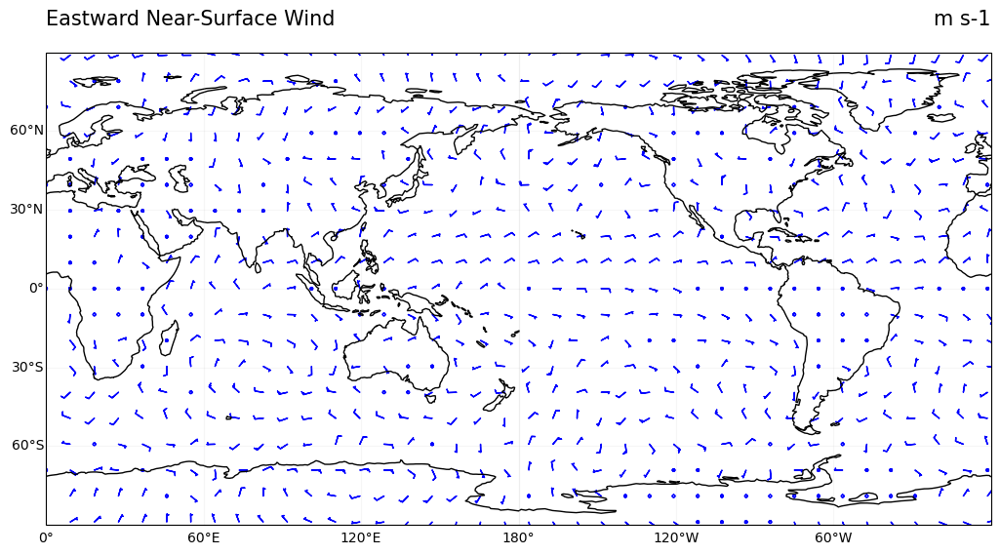

In [55]:
cshow(plotmap("","",ua,va,vecty="barbs", vecg=40, veco={'length':3.5, 'barbcolor' : 'blue'},))

### The third vector representation type is streamlines. Here is the [doc](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.streamplot.html#matplotlib.pyplot.streamplot) for more options

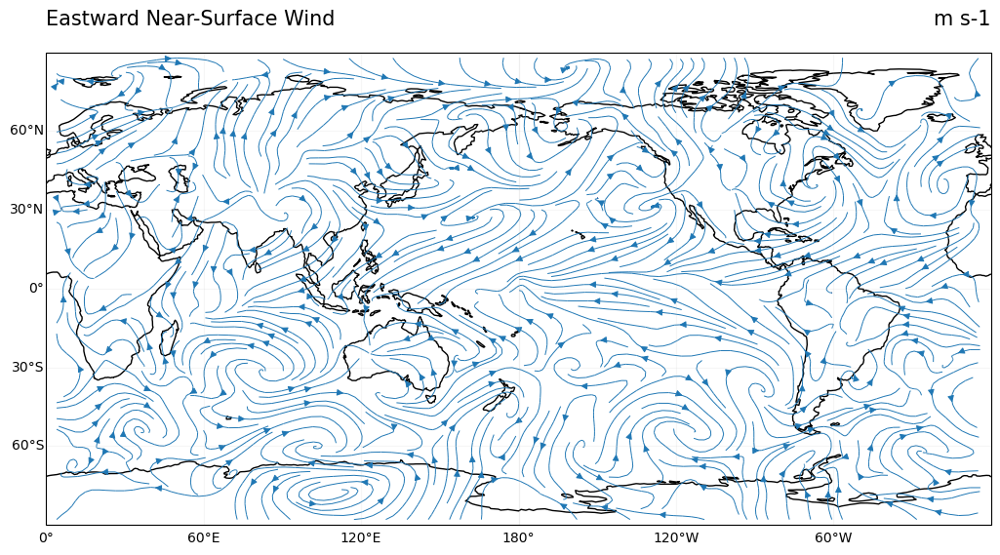

In [57]:
cshow(plotmap("","",ua,va,vecty="streamplot", veco={'density' : 3 , 'linewidth': 0.7}))

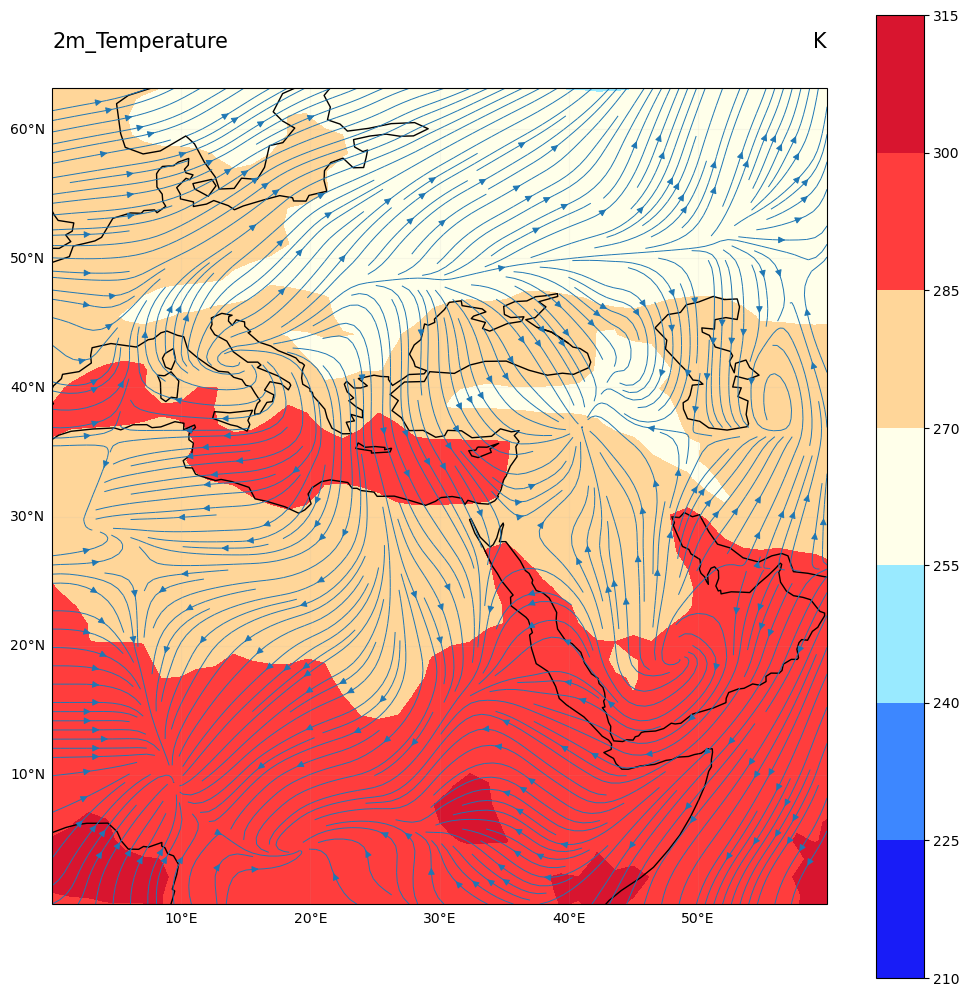

In [58]:
# Superimposing colored map and streamplot
cshow(plotmap(dg,"",ua,va,
              vecty="streamplot",  
              veco={'density' : 3 , 'linewidth': 0.7},
              axis_methods={'set_extent': {'extents': (0. , 60, 0., 60.) }}))

## Output formats

In [59]:
# Output in pdf format
f=cfile(plotmap(dg, format='pdf'))
print(f)
! display $f

/data/ssenesi/climaf_cache/d0/1e770f3522e3af4064b534f2bbc505fad6cbf729f5d78a22e7c885.pdf
/bin/bash: /net/nfs/tools/Users/SU/jservon/spirit-2021.11_envs/20240209/lib/libtinfo.so.6: no version information available (required by /bin/bash)


pdftk Warning: unexpected case 1 in LoadDataFile(); continuing


In [60]:
# Output in eps format
f=cfile(plotmap(dg, format='eps'))
print(f)
! display $f

/data/ssenesi/climaf_cache/62/968cb8e251f72c53fa54c57622de27180197b68f2fc06a483442e2.eps
/bin/bash: /net/nfs/tools/Users/SU/jservon/spirit-2021.11_envs/20240209/lib/libtinfo.so.6: no version information available (required by /bin/bash)


In [ ]:
# Launching plotmap with format='show' uses 
# matplotlib.show(block=True), which pops up a window. 
# This works only outisde a Notebook 

#cfile(plotmap(dg, format="show"))  

## Playing with projections, and using data on a rectangular projected grid

In [61]:
# Next data was generated on a grid that uses Lambert2 projection
l2 = fds(cpath + "/../examples/data/sfcWind_aladin_ext.nc")

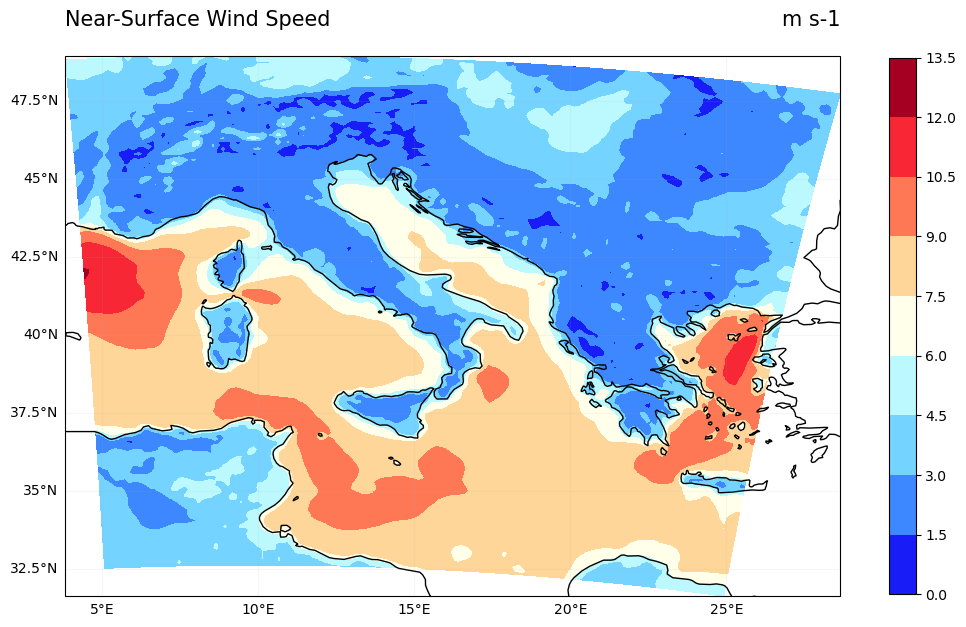

In [64]:
# As a default, target projection is PlateCarree
# Plotmap scrutinizes file metadata for identifying data projection parameters
cshow(plotmap(l2))

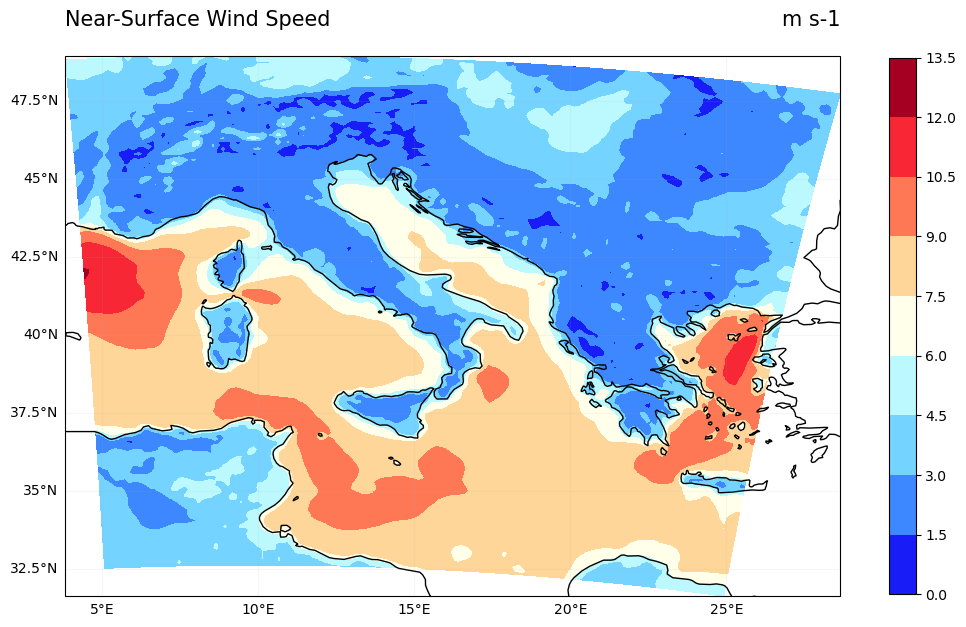

In [67]:
# We can also explicitly specify data grid's projection parameters
# This is useful if data file metadata is missing or not 'understandable' by plotmap
transform = { 
    'clrt' : 'LambertConformal', 
    'clrto' : {
        'central_longitude' : 10,
        'central_latitude'  : 37,
        'standard_parallels' : (37,37),
    }
    }
cshow(plotmap(l2, **transform))

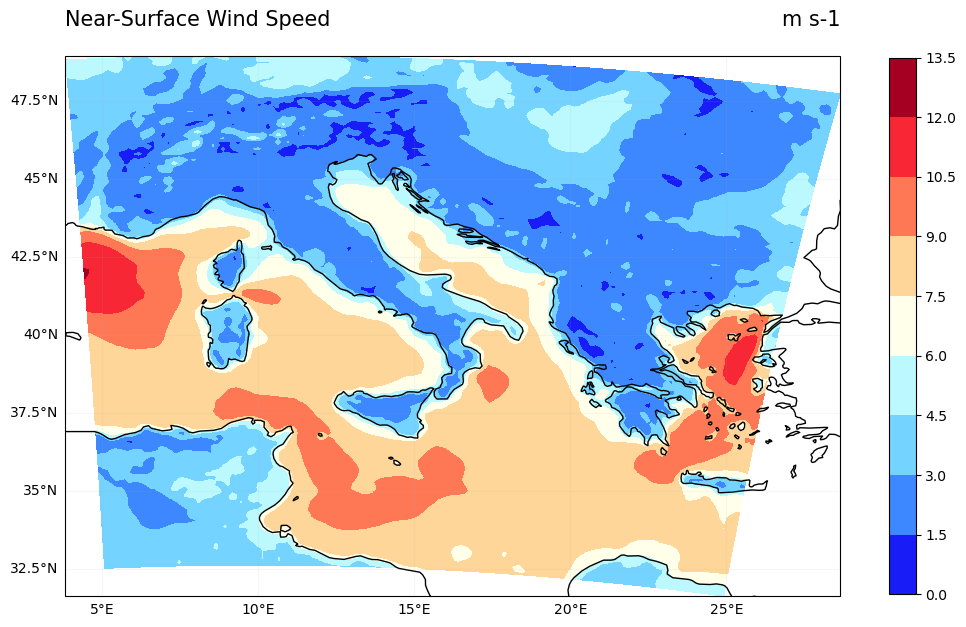

In [68]:
# Another way to explicitly specify data grid's projection parameters is 
# to provide a file which includes correct metadata
cshow(plotmap(l2, clrt=cfile(l2)))

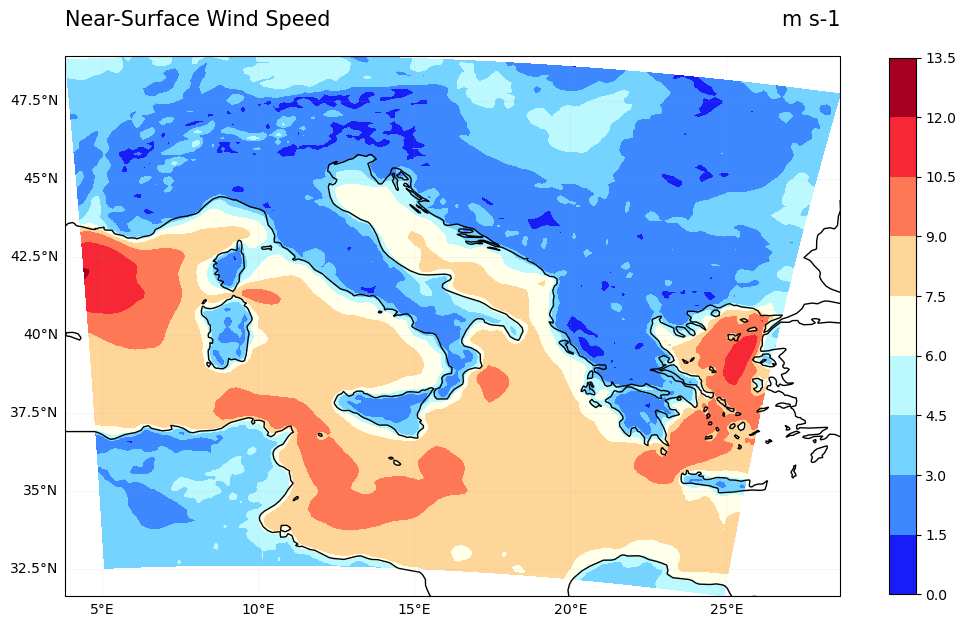

In [70]:
# This plot engine option speeds up computaton, but may damage the plot
cshow(plotmap(l2, clreo={'transform_first':True}))

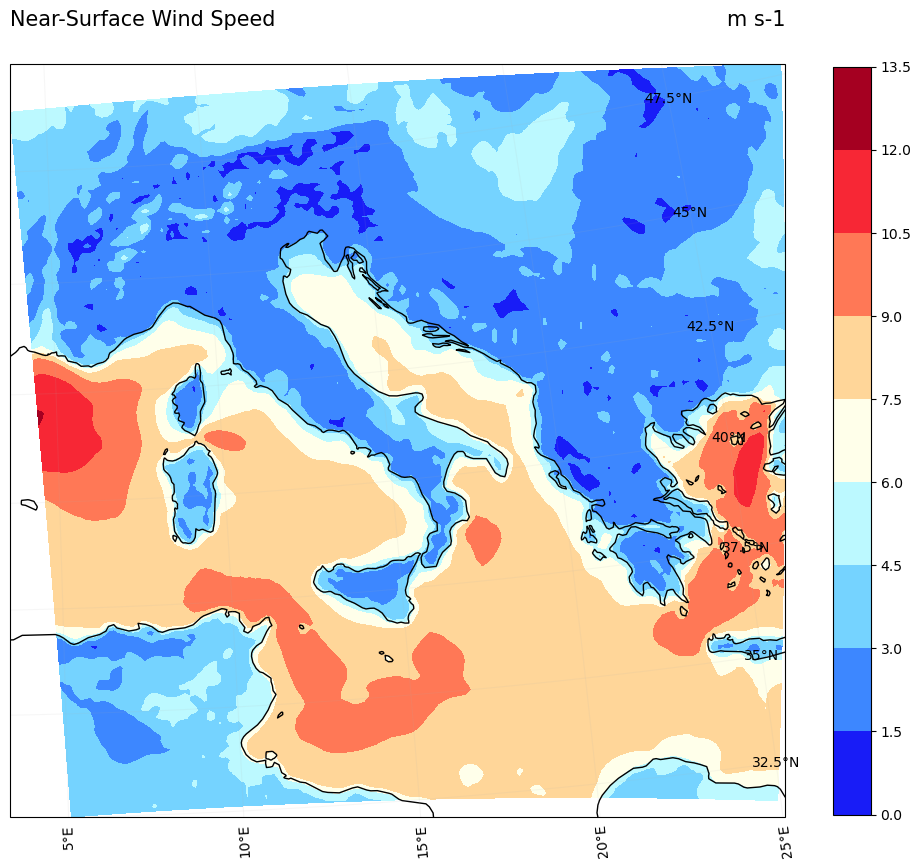

In [72]:
# We can request another target projection
cshow(plotmap(l2, proj="Stereographic"))

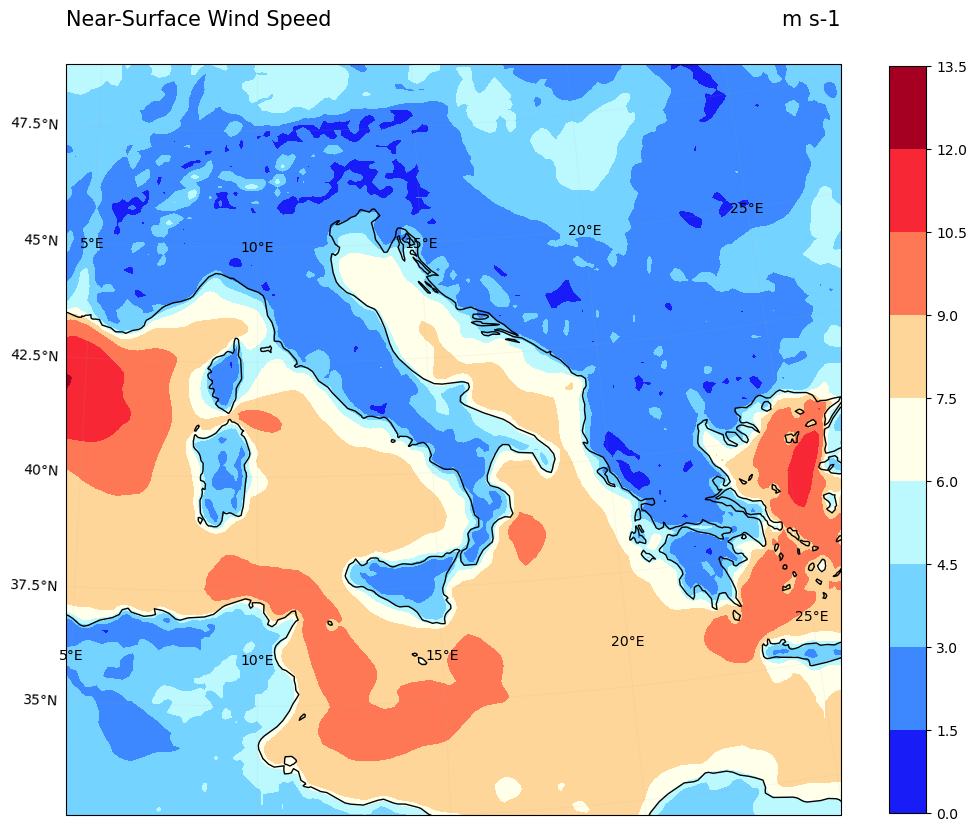

In [74]:
# If we want to plot on the data grid, we may describe it explicitly, 
# Here we use args 'proj' and 'proj_options', and pack them in a small dict
projection = { 
    'proj' : 'LambertConformal', 
    'proj_options' : {
        'central_longitude' : 10,
        'central_latitude'  : 37,
        'standard_parallels' : (37,37),
    }
    }
# Note : data will actually be remapped on its own grid (To be checked)
cshow(plotmap(l2, **projection))

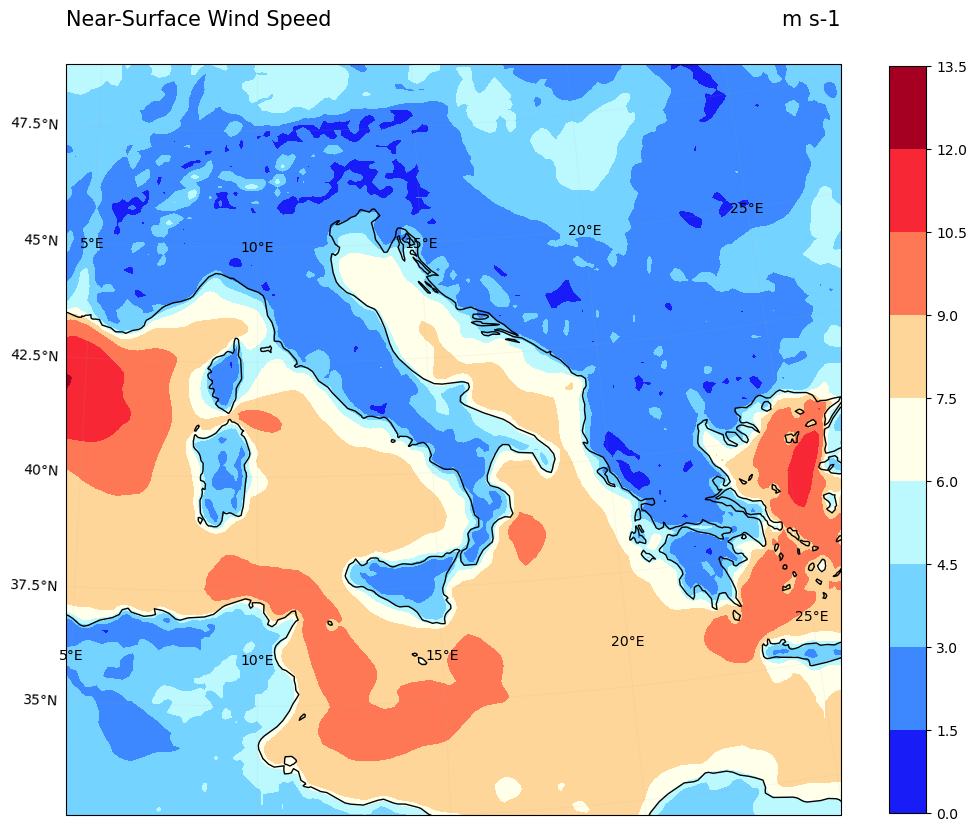

In [77]:
# But we can also just refer to the projection of the colored field 
cshow(plotmap(l2, proj="clr"))

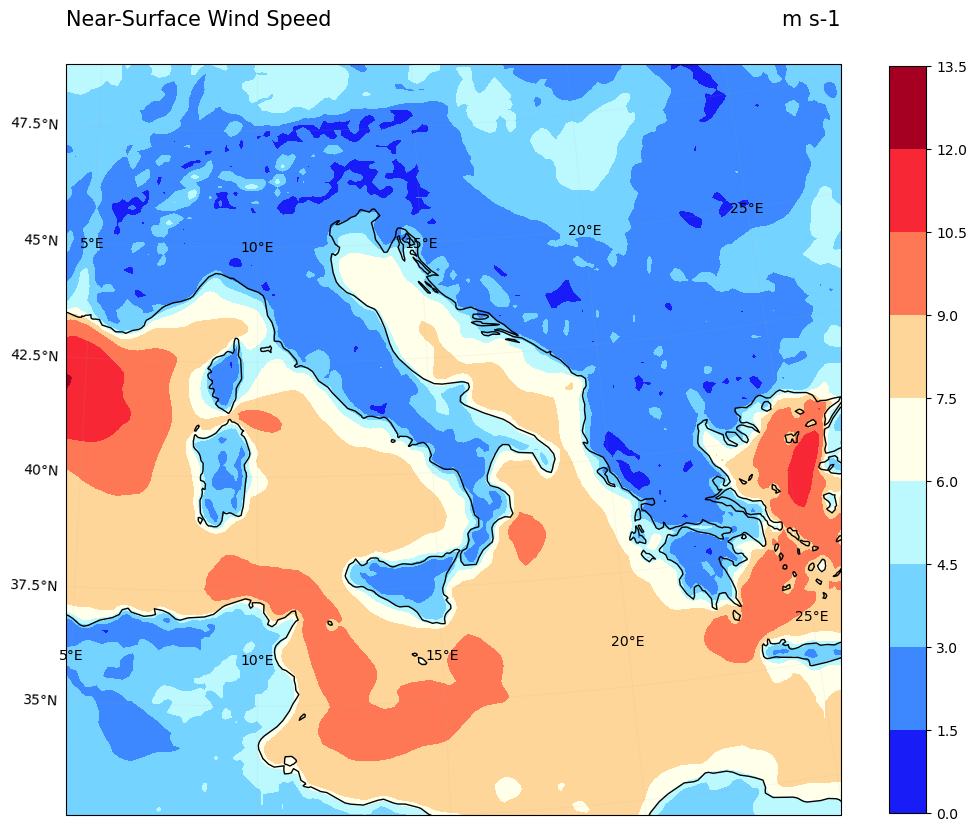

In [79]:
# We can also describe target projection using a file with relevant metadata
cshow(plotmap(l2, proj=cfile(l2)))

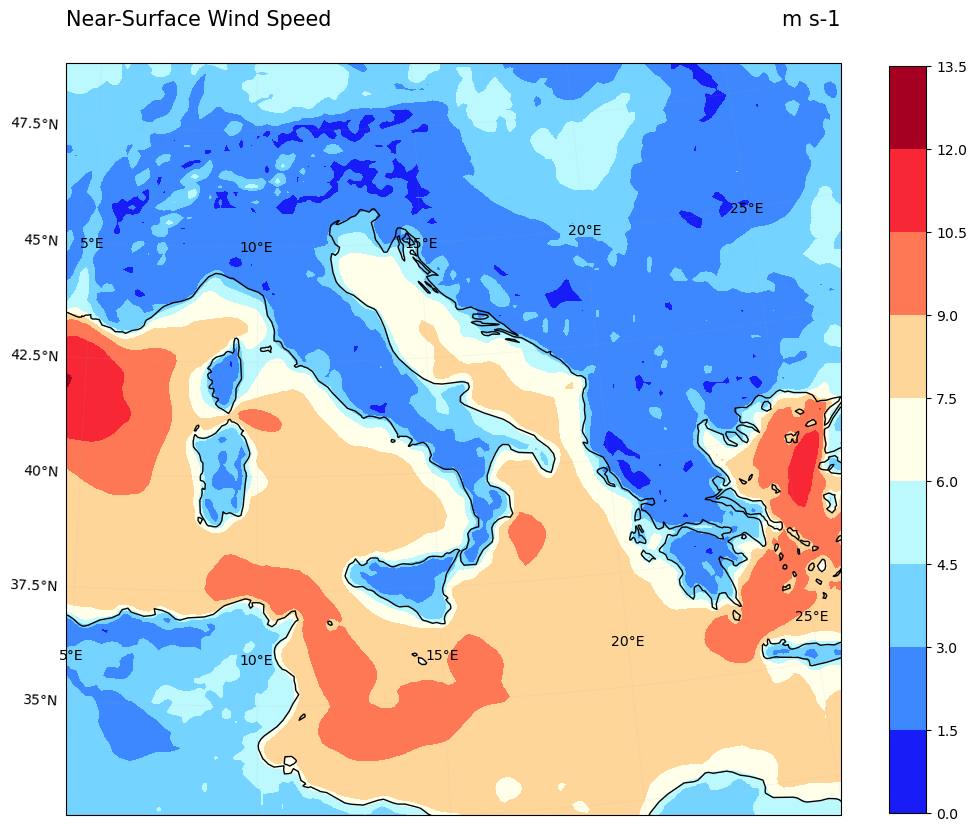

In [85]:
# We can explictly request that the data is not remapped. But there is no watch dog here !
cshow(plotmap(l2, proj=cfile(l2), clrt="no_remap"))

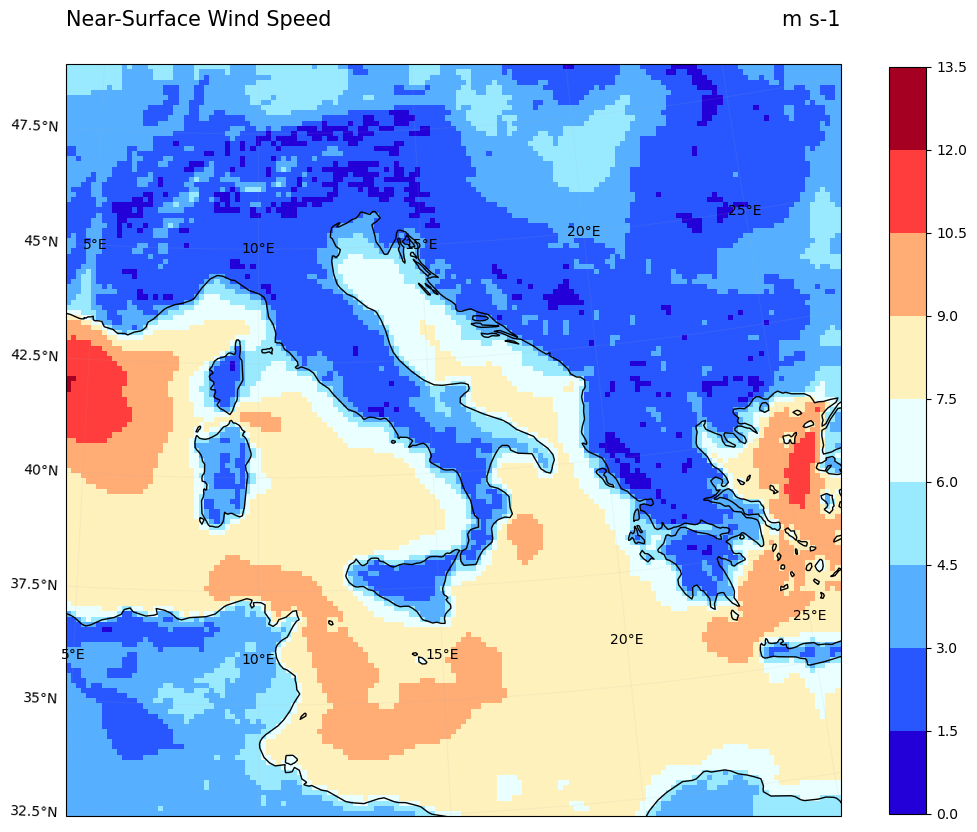

In [87]:
# Still without remapping, and using another plot engine to 'see' data grid cells
cshow(plotmap(l2, proj=cfile(l2), clrt="no_remap", clre="pcolormesh"))

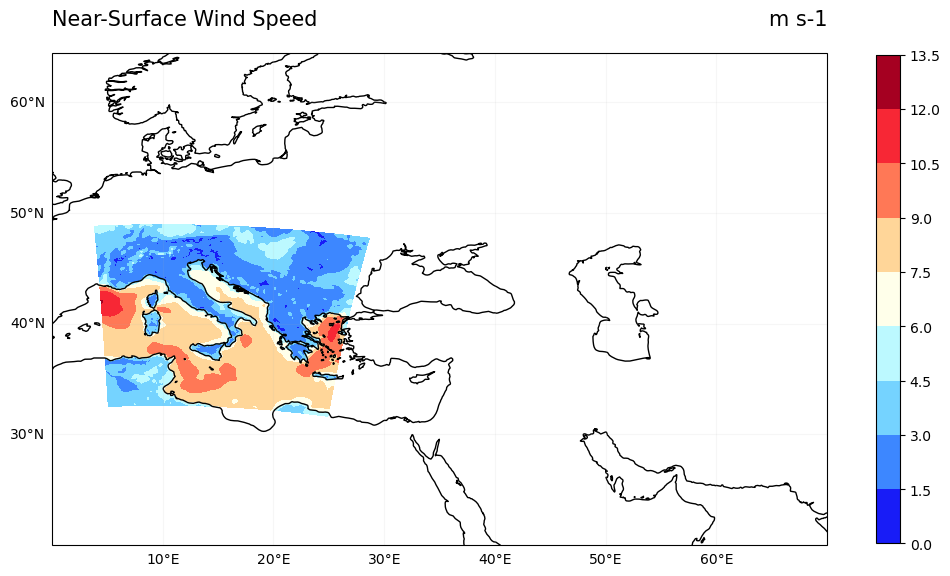

In [89]:
# Selecting the plot domain, using 'extents' (here projection PlateCarree is implicit)
cshow(plotmap(l2, axis_methods={'set_extent': {'extents': (0 , 70, 20, 60) }}))

## Advanced features

### The methods of [cartopy.mpl.geoaxes.GeoAxes](https://scitools.org.uk/cartopy/docs/latest/reference/generated/cartopy.mpl.geoaxes.GeoAxes.html#cartopy-mpl-geoaxes-geoaxes) can be called using arg axis_methods


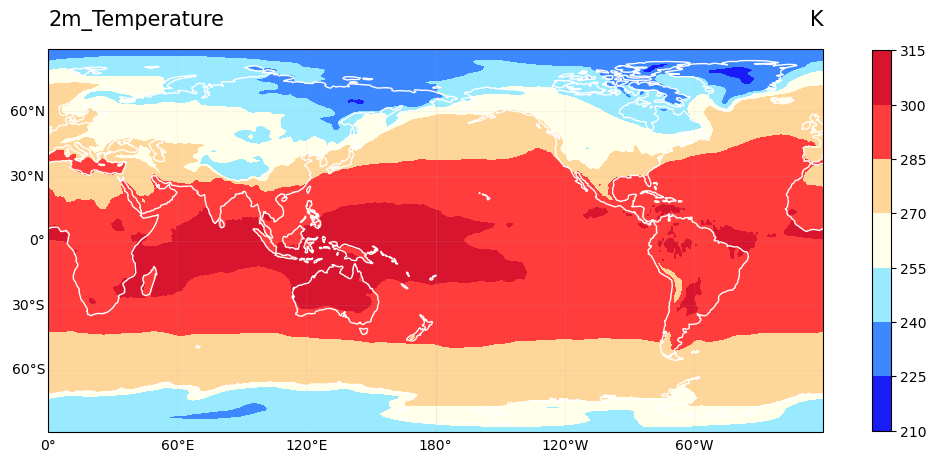

In [90]:
cshow(plotmap(dg, axis_methods={'coastlines': {'color': 'white'}}))

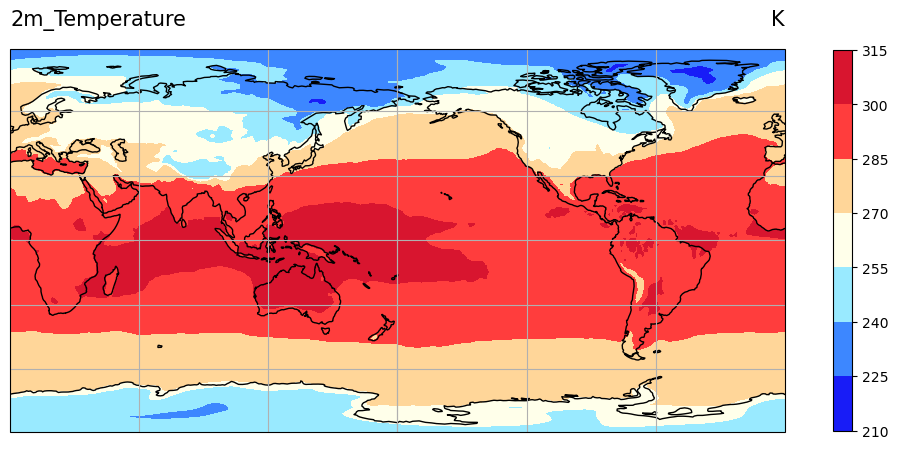

In [91]:
cshow(plotmap(dg, axis_methods={'gridlines': {}}))

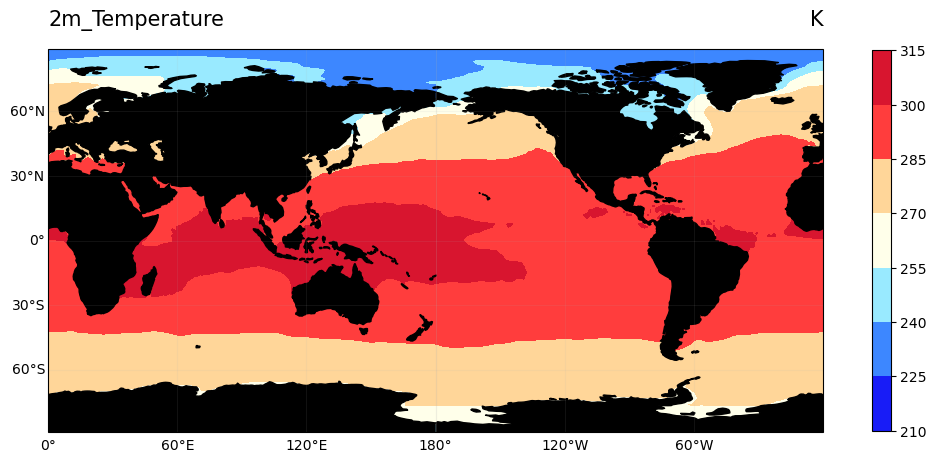

In [92]:
# Add feature (implictly from cartopy.feature) 
cshow(plotmap(dg, axis_methods={
    'add_feature': {'feature': 'LAND', 'facecolor': 'black', 'zorder': 1}}))

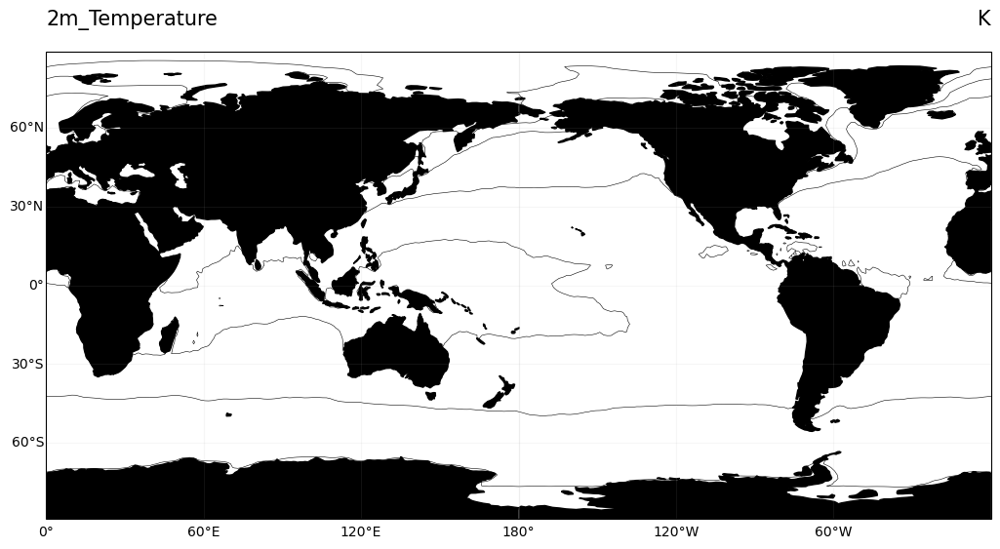

In [38]:
# Add feature on contoured field 
cshow(plotmap("",dg, axis_methods={                  
                  'add_feature': {'feature': 'LAND', 'facecolor': 'black', 'zorder': 1}}))

### Also, [Geocat-viz methods](https://geocat-viz.readthedocs.io/en/latest/user_api/index.html) can be invoked using arg 'gv_method'

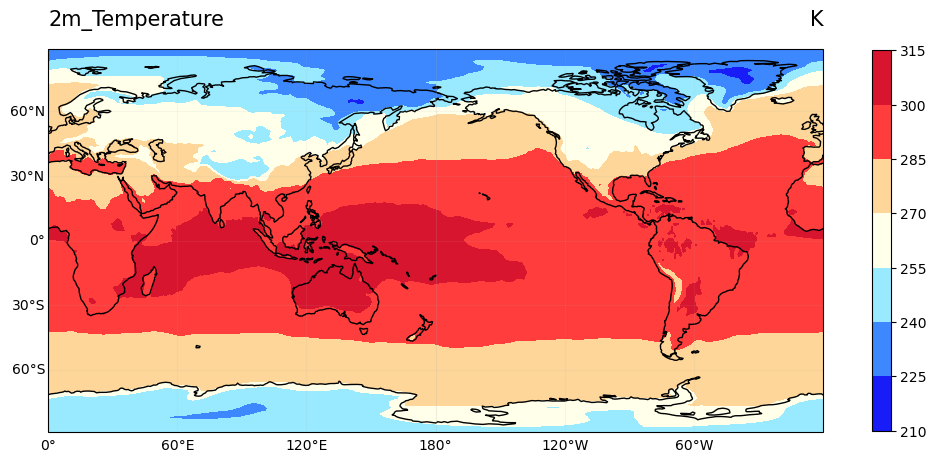

In [95]:
cshow(plotmap(dg, 
              gv_methods={'add_major_minor_ticks': { 
                              'labelsize':'small',
                              'x_minor_per_major':2
                              }}))

### Some methods of [matplotlib.pyplot](https://matplotlib.org/stable/api/pyplot_summary.html#module-matplotlib.pyplot) can be called using arg plt_methods


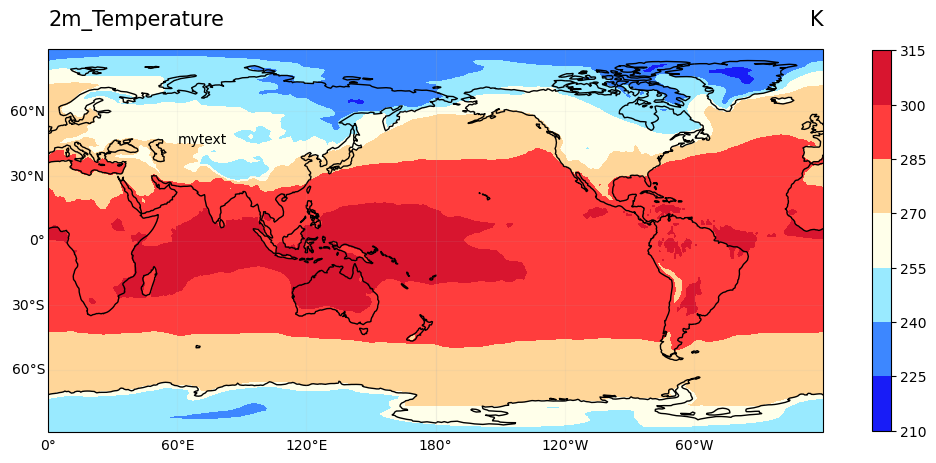

In [96]:
cshow(plotmap(dg, plt_methods={
    'text': {'x':-120, 'y': 45, 's': 'mytext', 'horizontalalignment': 'left'}}))